# Convolutional Autoencoder

Sticking with the MNIST dataset, let's improve our autoencoder's performance using convolutional layers. Again, loading modules and the data.

In [1]:
%matplotlib inline

import numpy as np
import tensorflow as tf 
import matplotlib.pyplot as plt
import os 
import matplotlib.pyplot as plt
from matplotlib.image import imread
from scipy.misc import imsave
from scipy.misc import imresize
import numpy as np
from numpy import genfromtxt
import tensorflow as tf
from PIL import Image
import pickle
# from tensorflow_vgg import vgg16|
import collections
import time
import math

# Import GEI dataset 

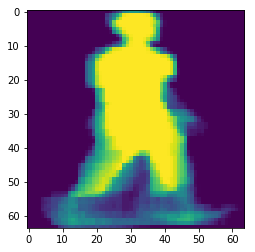

In [34]:
img = imread('{}'.format(os.path.join('OULP-C1V2_Pack/GEI/OULP-GEI-(224x224)-15f/Seq00/0000024', '0000024_55_GEI_15f.png')))
img = imresize(img, [64, 64], interp='nearest')
plt.imshow(img)
plt.show()

In [45]:
# Create Training Data
path = 'OULP-C1V2_Pack/GEI/OULP-GEI-(224x224)/Seq01'
Seq_15f_list = os.listdir(path)
Seq_15f_list.remove('.DS_Store')

Seq = []
for each_seq in Seq_15f_list:
    seq_path = os.path.join(path, each_seq)
    GEI = []
    for each_GEI in os.listdir(seq_path):
        img = imread('{}'.format(os.path.join(seq_path, each_GEI)))
        img = imresize(img, [64, 64], interp='nearest')
        GEI.append(img)
    Seq.append(np.array(GEI))
Seq = np.array(Seq)

In [46]:
with open('../gait_data/OULP_GEI/codes', 'wb') as f:
    np.save(f, Seq)

# Checkpoint 1

In [2]:
# gallery_15f = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_15f_Seq00', mode='rb'))
# probe_15f = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_15f_Seq01', mode='rb'))
gallery_full = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_full_Seq00', mode='rb'))
probe_full = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_full_Seq01', mode='rb'))

In [3]:
gallery_full = gallery_full/float(255)
probe_full = probe_full/float(255)

<br><br><br><br><br><br><br><br><br>

# Auto_Encoder 1: 55''-65''
### 先试full-full

In [9]:
# Train X
train_x = np.concatenate([gallery_full[:2800, 0], probe_full[:2800, 0]], axis=0)
train_x = np.reshape(train_x, [train_x.shape[0], train_x.shape[1], train_x.shape[2], 1])
# Train Y
train_y = np.concatenate([gallery_full[:2800, 1], probe_full[:2800, 1]], axis=0)
train_y = np.reshape(train_x, [train_x.shape[0], train_x.shape[1], train_x.shape[2], 1])
print('train_x', train_x.shape, 'train_y', train_y.shape)

# Val X
val_x = gallery_full[2800:, 0]
val_x = np.reshape(val_x, [val_x.shape[0], val_x.shape[1], val_x.shape[2], 1])
# Val Y
val_y = gallery_full[2800:, 1]
val_y = np.reshape(val_y, [val_y.shape[0], val_y.shape[1], val_y.shape[2], 1])
print('val_x', val_x.shape, 'val_y', val_y.shape)

# Test X
test_x = probe_full[2800:, 0]
test_x = np.reshape(test_x, [test_x.shape[0], test_x.shape[1], test_x.shape[2], 1])
# Test Y
test_y = probe_full[2800:, 1]
test_y = np.reshape(test_x, [test_x.shape[0], test_x.shape[1], test_x.shape[2], 1])
print('test_x', test_x.shape, 'test_y', test_y.shape)

train_x (5600, 64, 64, 1) train_y (5600, 64, 64, 1)
val_x (346, 64, 64, 1) val_y (346, 64, 64, 1)
test_x (346, 64, 64, 1) test_y (346, 64, 64, 1)


# Create Graph

In [10]:
def build_inputs_outputs():
    inputs_1 = tf.placeholder(tf.float32, (None, 64, 64, 1), name='inputs_1')
    targets_1 = tf.placeholder(tf.float32, (None, 64, 64, 1), name='targets_1')
    
    return inputs_1, targets_1

def conv_layer(inputs_, weights_name, bias_name, conv_name, pool_name, bn_name, relu_name, add_bacth_norm=True, is_training=True, 
               set_stddev=0.03, out_dim=1, conv_kernsize=(2,2), conv_strides=(1,1), pool_size=(2,2), pool_strides=(2,2), 
               keep_prob=0.5):
    ### Encoder
    # e.g. out_dim: 8; kern_size: (3,3); pool_size: (2,2); strides: (2,2);
        
    # filter:[filter_height, filter_width, in_channels, out_channels]
    weight = tf.Variable(tf.truncated_normal([conv_kernsize[0],conv_kernsize[1],\
                         inputs_.get_shape().as_list()[3], out_dim], stddev=set_stddev),\
                         name=weights_name) 
    
    # Set bias
    bias = tf.Variable(tf.zeros(out_dim), name=bias_name)
    
    # set strides of conv2d
    stride = [1, conv_strides[0], conv_strides[1], 1]
    
    # conv2d
    # input:[batch, in_height, in_width, in_channels]
    conv2d = tf.nn.bias_add(tf.nn.conv2d(inputs_, weight, stride, padding='SAME', name=conv_name), bias)
    
    # Now 28x28x
    if add_bacth_norm:
        conv2d = tf.layers.batch_normalization(conv2d, training=is_training, name=bn_name)
        
    # add activation function
    conv2d = tf.nn.relu(conv2d, name=relu_name)
    
    # add Max pooling
    conv2d_maxpool = tf.nn.max_pool(conv2d, [1,pool_size[0],pool_size[1],1],\
                                    [1,pool_strides[0],pool_strides[1],1], padding='SAME', name=pool_name)
                    
    conv2d_maxpool = tf.layers.dropout(conv2d_maxpool, rate=keep_prob)

    return conv2d_maxpool

#     # Now 14x14x16
#     conv2 = tf.layers.conv2d(maxpool1, 8, (3,3), padding='same', activation=tf.nn.relu)
#     # Now 14x14x8
#     maxpool2 = tf.layers.max_pooling2d(conv2, (2,2), (2,2), padding='same')
#     # Now 7x7x8
#     conv3 = tf.layers.conv2d(maxpool2, 8, (3,3), padding='same', activation=tf.nn.relu)
#     # Now 7x7x8
#     encoded = tf.layers.max_pooling2d(conv3, (2,2), (2,2), padding='same')
#     # Now 4x4x8

def deconv_layer(encoded, up_name, weights_name, bias_name, de_conv_name, bn_name, relu_name, add_batch_norm=True, is_training=True, 
                 set_stddev=0.03, up_size=[(2,2),(4,4),(5,5),(6,6)], out_dim=1, conv_kernsize=(2,2), conv_strides=(1,1), keep_prob=0.5):
    ### Decoder
    upsample = tf.image.resize_nearest_neighbor(encoded, up_size, name=up_name) # up_size: e.g.(7,7)
    
    # set weight (filter)
    weight = tf.Variable(tf.truncated_normal([conv_kernsize[0],conv_kernsize[1],\
                         upsample.get_shape().as_list()[3], out_dim], stddev=set_stddev),\
                         name=weights_name)
    
    # set bias
    bias = tf.Variable(tf.zeros(out_dim), name=bias_name)
    
    # set strides of conv2d
    stride = [1, conv_strides[0], conv_strides[1], 1]
    
    # conv2d
    conv2d = tf.nn.bias_add(tf.nn.conv2d(upsample, weight, stride, padding='SAME', name=de_conv_name),\
                   bias)
    
    if add_batch_norm:
        conv2d = tf.layers.batch_normalization(conv2d, training=is_training, name=bn_name)
    
    conv2d = tf.nn.relu(conv2d, name=relu_name)
    
    conv2d = tf.layers.dropout(conv2d, rate=keep_prob)
    
    return conv2d

#     # Now 7x7x8
#     upsample2 = tf.image.resize_nearest_neighbor(conv4, (14,14))
#     # Now 14x14x8
#     conv5 = tf.layers.conv2d(upsample2, 8, (3,3), padding='same', activation=tf.nn.relu)
#     # Now 14x14x8
#     upsample3 = tf.image.resize_nearest_neighbor(conv5, (28,28))
#     # Now 28x28x8
#     conv6 = tf.layers.conv2d(upsample3, 16, (3,3), padding='same', activation=tf.nn.relu)
#     # Now 28x28x16

def output_layer(conv2d, weights_name, bias_name, logits_name, bn_name, decoded_name, add_batch_norm=True, is_training=True, 
                 set_stddev=0.03, out_dim=1, conv_kernsize=(3,3), conv_strides=(1,1)):
    # set weight (filter)
    weight = tf.Variable(tf.truncated_normal([conv_kernsize[0],conv_kernsize[1],\
                         conv2d.get_shape().as_list()[3], out_dim], stddev=set_stddev),\
                         name=weights_name)
    
    # set bias
    bias = tf.Variable(tf.zeros(out_dim), name=bias_name)
    
    # set strides of conv2d
    stride = [1, conv_strides[0], conv_strides[1], 1]
    
    # conv2d
    logits = tf.nn.bias_add(tf.nn.conv2d(conv2d, weight, stride, padding='SAME', name=logits_name),\
                   bias)
    
    if add_batch_norm:
        conv2d = tf.layers.batch_normalization(conv2d, training=is_training, name=bn_name)
    #Now 28x28x1
    decoded = tf.nn.sigmoid(logits, name=decoded_name)
    
    return logits, decoded

In [11]:
def build_graph(kern_size, std, conv_strides, pool_size, pool_strides, de_kern_size, 
                de_conv_strides, out_kern_size, out_strides, up_size=[(16,16), (32,32), (64,64)]):
    
    # reset graph
    tf.reset_default_graph()
    
    with tf.name_scope('inputs_targets'):
        inputs_1, targets_1 = build_inputs_outputs()
    
    keep_p = tf.placeholder(tf.float32, name="keep_prob")
    
    learning_rate = tf.placeholder(tf.float32, name='learning_rate')
    
    training = tf.placeholder(tf.bool, name='training')
    
    with tf.name_scope('conv_layers'):
        
        maxpool_1 = conv_layer(inputs_1, 'conv_weights_1', 'bias_1', 'conv_1', 'pool_1', 'bn_1', 'relu_1', add_bacth_norm=False, 
                               is_training=training, set_stddev=std, out_dim=16, conv_kernsize=kern_size, conv_strides=conv_strides, 
                               pool_size=pool_size, pool_strides=pool_strides, keep_prob=keep_p)
        
        maxpool_2 = conv_layer(maxpool_1, 'conv_weights_2', 'bias_2', 'conv_2', 'pool_2', 'bn_2', 'relu_2', add_bacth_norm=True, 
                               is_training=training, set_stddev=std, out_dim=8, conv_kernsize=kern_size, conv_strides=conv_strides, 
                               pool_size=pool_size, pool_strides=pool_strides, keep_prob=keep_p)
        
#         maxpool_3 = conv_layer(maxpool_2, 'conv_weights_3', 'conv_3', 'pool_3', 'bn_3', 'relu_3', add_bacth_norm=True, 
#                                is_training=training, set_stddev=std, out_dim=8, conv_kernsize=kern_size, conv_strides=conv_strides, 
#                                pool_size=pool_size, pool_strides=pool_strides, keep_prob=keep_p)
        
#         maxpool_4 = conv_layer(maxpool_3, 'conv_weights_4', 'conv_4', 'pool_4', 'bn_4', 'relu_4', add_bacth_norm=True, 
#                                is_training=set_is_training, set_stddev=std, out_dim=8, conv_kernsize=kern_size, conv_strides=conv_strides, 
#                                pool_size=pool_size, pool_strides=pool_strides, keep_prob=keep_p)
        # Now 4x4x8 as hidden layer
        
    with tf.name_scope('deconv_layers'):
        
        deconv_1 = deconv_layer(maxpool_2, 'up_1', 'deconv_weights_1', 'debias_1', 'deconv_1', 'de_bn_1', 'de_relu_1', add_batch_norm=True, 
                              is_training=training, set_stddev=std, up_size=up_size[0], out_dim=8, conv_kernsize=de_kern_size,
                              conv_strides=de_conv_strides, keep_prob=keep_p)
        
        deconv_2 = deconv_layer(deconv_1, 'up_2', 'deconv_weights_2', 'debias_2', 'deconv_2', 'de_bn_2', 'de_relu_2', add_batch_norm=True, 
                              is_training=training, set_stddev=std, up_size=up_size[1], out_dim=16, conv_kernsize=de_kern_size,
                              conv_strides=de_conv_strides, keep_prob=keep_p)
        
#         deconv_3 = deconv_layer(deconv_2, 'up_3', 'deconv_weights_3', 'deconv_3', 'de_bn_3', 'de_relu_3', add_batch_norm=True, 
#                               is_training=training, set_stddev=std, up_size=up_size[2], out_dim=16, conv_kernsize=de_kern_size,
#                               conv_strides=de_conv_strides, keep_prob=keep_p)
        
#         deconv_4 = deconv_layer(deconv_3, 'up_4', 'deconv_weights_4', 'deconv_4', 'de_bn_4', 'de_relu_4', add_batch_norm=True, 
#                               is_training=set_is_training, set_stddev=std, up_size=up_size[3], out_dim=16, conv_kernsize=de_kern_size,
#                               conv_strides=de_conv_strides, keep_prob=keep_p)
        
    with tf.name_scope('output_layer'):
       
        logits, decoded = output_layer(deconv_2, 'output_weights', 'outbias_1', 'logits', 'bn', 'decoded', add_batch_norm=True, is_training=training, 
                                       set_stddev=std, out_dim=1, conv_kernsize=out_kern_size, conv_strides=out_strides)
        
    loss = tf.nn.sigmoid_cross_entropy_with_logits(labels=targets_1, logits=logits, name='loss')
    cost = tf.reduce_mean(loss, name='cost')
    opt = tf.train.AdamOptimizer(learning_rate).minimize(cost)
    
    with tf.name_scope('saver'):
        saver = tf.train.Saver()
        
#     merged = tf.summary.merge_all()
    
    export_nodes = ['inputs_1', 'targets_1', 'maxpool_1', 'maxpool_2', 'deconv_1', 'deconv_2', 'training',
                    'logits', 'decoded', 'loss', 'cost', 'opt', 'saver', 'learning_rate', 'keep_p']
    
    Graph = collections.namedtuple('Graph', export_nodes)
    local_dict = locals()
    graph = Graph(*[local_dict[each] for each in export_nodes])
    
    return graph

In [12]:
def get_batches(data, target, batch_size):
    n_batches = len(data)//batch_size
    data = data[:batch_size * n_batches]
    target = target[:batch_size * n_batches]
    for ii in range(0, batch_size*n_batches, batch_size):
        data_batch = data[ii:ii + batch_size]
        target_batch = target[ii:ii + batch_size]
        
        yield data_batch, target_batch
        
        
def cal_accuracy(decoded, target):
    error = abs(decoded - target)
    Acc = (np.sum(error <= 0.08)/(decoded.shape[0]*decoded.shape[1]*decoded.shape[2]*decoded.shape[3]))*100
    
    return Acc

In [13]:
error = np.random.rand(10,5,5,1)
np.sum(error >= 0.9)/100

0.32000000000000001

In [14]:
def train(model, epochs, save_string):

    with tf.Session(config=tf.ConfigProto(log_device_placement=True)) as sess:
        sess.run(tf.global_variables_initializer())
        
        iteration = 1
        mean_val_loss = 0
        mean_val_acc = 0
        count_loss_not_decrease_epochs = 0
        count_acc_not_decrease_epochs = 0
        Last_val_loss = 0
        Last_val_acc = 0
        
        
        for e in range(epochs):
            for train_batch, target_batch in get_batches(train_x, train_y, batch_size):
                    
                start = time.time()
                
                feed_1 = {
                        model.inputs_1: train_batch, 
                        model.targets_1: target_batch,
                        model.keep_p: 0.6,
                        model.learning_rate: lr,
                        model.training:True
                        }

                train_loss, _, decoded_img = sess.run([model.cost, model.opt, model.decoded], feed_dict=feed_1)
                
                train_acc = cal_accuracy(decoded_img, target_batch)
                
                if iteration%25==0:
                    end = time.time()
#                     acc = calculate_accuracy(sess, pred, target_batch, sq_length)
                    print("Epoch: {}/{},".format(e+1, epochs),' '
                          "Iteration: {},".format(iteration),' '
                          "Train loss: {:.3f},".format(train_loss),'      '
                          "{:.1f}s /batch.".format((end-start)/5),' '
                          "Train Accuracy: %{:.3f}".format(train_acc))

                ##############################################################
                ######################## VALIDATION ##########################
                ##############################################################
                
                if iteration%75==0:
#                     training = True
                    validation_loss = []
                    validation_acc = []
                    
                    if batch_size >= len(val_x):
                        val_batch_size = len(val_x)
                    else: 
                        val_batch_size = batch_size
                        

                    for ii, (val_batch, val_target_batch) in enumerate(get_batches(val_x, val_y, val_batch_size)):
#                         print(ii, len(val_x)//val_batch_size)
                        feed_2 = {
                                model.inputs_1: val_batch,
                                model.targets_1: val_target_batch,
                                model.keep_p: 1,
                                model.training:True
                                }
                        
                        val_loss, val_decoded_img = sess.run([model.cost, model.decoded], 
                                                                          feed_dict=feed_2)

                        val_acc = cal_accuracy(val_decoded_img, val_target_batch)
                        
                        validation_loss.append(val_loss)
                        validation_acc.append(val_acc)
                    
                    Last_val_loss = mean_val_loss
                    Last_val_acc = mean_val_acc
                    mean_val_loss = np.mean(np.array(validation_loss))
                    mean_val_acc = np.mean(np.array(validation_acc))
                    
                    print()
                    print("Validation loss: {:.3f},".format(mean_val_loss),' '
                          "Validation accuracy: {:.3f},".format(mean_val_acc))
#                           "maxpool_3.shape: {}.".format(max_pool_3[0].shape))
                    print()
                ####### plot #######
                if iteration%500==0:
                    
                    feed_3 = {
                            model.inputs_1: val_x[:10],
                            model.keep_p: 1,
                            model.training:True
                            }
                    
                    fig, axes = plt.subplots(nrows=2, ncols=10, sharex=True, sharey=True, figsize=(20,4))
                    in_imgs = val_y[:10]
                    reconstructed = sess.run(model.decoded, feed_dict=feed_3)

                    # plot out
                    for images, row in zip([in_imgs, reconstructed], axes):
                        for img, ax in zip(images, row):
                            ax.imshow(img.reshape((64, 64)), cmap='Greys_r')
                            ax.get_xaxis().set_visible(False)
                            ax.get_yaxis().set_visible(False)


                    fig.tight_layout(pad=0.1)
                            
                    
                    
                    
                    
                iteration += 1
                
#             # Early stopping  
#             if mean_val_Acc - Last_val_Acc <= -0.3:
#                 count_Acc_not_increase_epochs += 1
#             if Last_val_loss - mean_val_loss <= -0.01:
#                 count_loss_not_decrease_epochs += 1
                
#             if mean_val_Acc - Last_val_Acc <= -2:
#                 break
#             if count_Acc_not_increase_epochs >= 10:
#                 break
#             if count_loss_not_decrease_epochs >= 10:
#                 break
                
        model.saver.save(sess, r"{}".format(save_string))

mkdir: cannot create directory ‘checkpoints_view_invariant’: File exists
Epoch: 1/1500,  Iteration: 25,  Train loss: 0.268,       0.0s /batch.  Train Accuracy: %65.895
Epoch: 1/1500,  Iteration: 50,  Train loss: 0.237,       0.0s /batch.  Train Accuracy: %87.659
Epoch: 2/1500,  Iteration: 75,  Train loss: 0.234,       0.0s /batch.  Train Accuracy: %90.166

Validation loss: 0.237,  Validation accuracy: 80.569,

Epoch: 2/1500,  Iteration: 100,  Train loss: 0.225,       0.0s /batch.  Train Accuracy: %92.120
Epoch: 2/1500,  Iteration: 125,  Train loss: 0.223,       0.0s /batch.  Train Accuracy: %92.163
Epoch: 3/1500,  Iteration: 150,  Train loss: 0.227,       0.0s /batch.  Train Accuracy: %94.705

Validation loss: 0.235,  Validation accuracy: 82.778,

Epoch: 3/1500,  Iteration: 175,  Train loss: 0.225,       0.0s /batch.  Train Accuracy: %94.503
Epoch: 3/1500,  Iteration: 200,  Train loss: 0.224,       0.0s /batch.  Train Accuracy: %94.777
Epoch: 4/1500,  Iteration: 225,  Train loss: 0.229

Epoch: 26/1500,  Iteration: 1800,  Train loss: 0.223,       0.0s /batch.  Train Accuracy: %97.853

Validation loss: 0.239,  Validation accuracy: 83.072,

Epoch: 27/1500,  Iteration: 1825,  Train loss: 0.224,       0.0s /batch.  Train Accuracy: %98.669
Epoch: 27/1500,  Iteration: 1850,  Train loss: 0.218,       0.0s /batch.  Train Accuracy: %98.555
Epoch: 27/1500,  Iteration: 1875,  Train loss: 0.217,       0.0s /batch.  Train Accuracy: %98.338

Validation loss: 0.235,  Validation accuracy: 84.126,

Epoch: 28/1500,  Iteration: 1900,  Train loss: 0.223,       0.0s /batch.  Train Accuracy: %98.699
Epoch: 28/1500,  Iteration: 1925,  Train loss: 0.220,       0.0s /batch.  Train Accuracy: %98.642
Epoch: 28/1500,  Iteration: 1950,  Train loss: 0.220,       0.0s /batch.  Train Accuracy: %98.582

Validation loss: 0.237,  Validation accuracy: 83.778,

Epoch: 29/1500,  Iteration: 1975,  Train loss: 0.226,       0.0s /batch.  Train Accuracy: %97.632
Epoch: 29/1500,  Iteration: 2000,  Train loss: 0

Epoch: 51/1500,  Iteration: 3550,  Train loss: 0.222,       0.0s /batch.  Train Accuracy: %98.458
Epoch: 52/1500,  Iteration: 3575,  Train loss: 0.224,       0.0s /batch.  Train Accuracy: %99.118
Epoch: 52/1500,  Iteration: 3600,  Train loss: 0.217,       0.0s /batch.  Train Accuracy: %99.058

Validation loss: 0.234,  Validation accuracy: 84.576,

Epoch: 52/1500,  Iteration: 3625,  Train loss: 0.216,       0.0s /batch.  Train Accuracy: %98.876
Epoch: 53/1500,  Iteration: 3650,  Train loss: 0.222,       0.0s /batch.  Train Accuracy: %99.136
Epoch: 53/1500,  Iteration: 3675,  Train loss: 0.220,       0.0s /batch.  Train Accuracy: %99.010

Validation loss: 0.235,  Validation accuracy: 84.462,

Epoch: 53/1500,  Iteration: 3700,  Train loss: 0.220,       0.0s /batch.  Train Accuracy: %98.997
Epoch: 54/1500,  Iteration: 3725,  Train loss: 0.225,       0.0s /batch.  Train Accuracy: %98.415
Epoch: 54/1500,  Iteration: 3750,  Train loss: 0.227,       0.0s /batch.  Train Accuracy: %99.065

Valid

Epoch: 77/1500,  Iteration: 5325,  Train loss: 0.224,       0.0s /batch.  Train Accuracy: %99.339

Validation loss: 0.234,  Validation accuracy: 83.991,

Epoch: 77/1500,  Iteration: 5350,  Train loss: 0.217,       0.0s /batch.  Train Accuracy: %99.289
Epoch: 77/1500,  Iteration: 5375,  Train loss: 0.216,       0.0s /batch.  Train Accuracy: %98.934
Epoch: 78/1500,  Iteration: 5400,  Train loss: 0.222,       0.0s /batch.  Train Accuracy: %99.344

Validation loss: 0.234,  Validation accuracy: 83.940,

Epoch: 78/1500,  Iteration: 5425,  Train loss: 0.220,       0.0s /batch.  Train Accuracy: %99.289
Epoch: 78/1500,  Iteration: 5450,  Train loss: 0.220,       0.0s /batch.  Train Accuracy: %99.271
Epoch: 79/1500,  Iteration: 5475,  Train loss: 0.225,       0.0s /batch.  Train Accuracy: %98.754

Validation loss: 0.243,  Validation accuracy: 82.692,

Epoch: 79/1500,  Iteration: 5500,  Train loss: 0.227,       0.0s /batch.  Train Accuracy: %99.285
Epoch: 79/1500,  Iteration: 5525,  Train loss: 0

Epoch: 102/1500,  Iteration: 7075,  Train loss: 0.224,       0.0s /batch.  Train Accuracy: %99.469
Epoch: 102/1500,  Iteration: 7100,  Train loss: 0.217,       0.0s /batch.  Train Accuracy: %99.394
Epoch: 102/1500,  Iteration: 7125,  Train loss: 0.216,       0.0s /batch.  Train Accuracy: %98.866

Validation loss: 0.236,  Validation accuracy: 84.393,

Epoch: 103/1500,  Iteration: 7150,  Train loss: 0.222,       0.0s /batch.  Train Accuracy: %99.484
Epoch: 103/1500,  Iteration: 7175,  Train loss: 0.219,       0.0s /batch.  Train Accuracy: %99.440
Epoch: 103/1500,  Iteration: 7200,  Train loss: 0.220,       0.0s /batch.  Train Accuracy: %99.378

Validation loss: 0.235,  Validation accuracy: 84.616,

Epoch: 104/1500,  Iteration: 7225,  Train loss: 0.225,       0.0s /batch.  Train Accuracy: %98.943
Epoch: 104/1500,  Iteration: 7250,  Train loss: 0.227,       0.0s /batch.  Train Accuracy: %99.380
Epoch: 104/1500,  Iteration: 7275,  Train loss: 0.220,       0.0s /batch.  Train Accuracy: %99.4

Epoch: 127/1500,  Iteration: 8825,  Train loss: 0.224,       0.0s /batch.  Train Accuracy: %99.529
Epoch: 127/1500,  Iteration: 8850,  Train loss: 0.217,       0.0s /batch.  Train Accuracy: %99.484

Validation loss: 0.238,  Validation accuracy: 84.639,

Epoch: 127/1500,  Iteration: 8875,  Train loss: 0.216,       0.0s /batch.  Train Accuracy: %98.926
Epoch: 128/1500,  Iteration: 8900,  Train loss: 0.222,       0.0s /batch.  Train Accuracy: %99.528
Epoch: 128/1500,  Iteration: 8925,  Train loss: 0.219,       0.0s /batch.  Train Accuracy: %99.466

Validation loss: 0.237,  Validation accuracy: 84.204,

Epoch: 128/1500,  Iteration: 8950,  Train loss: 0.220,       0.0s /batch.  Train Accuracy: %99.262
Epoch: 129/1500,  Iteration: 8975,  Train loss: 0.225,       0.0s /batch.  Train Accuracy: %98.994
Epoch: 129/1500,  Iteration: 9000,  Train loss: 0.227,       0.0s /batch.  Train Accuracy: %99.486

Validation loss: 0.236,  Validation accuracy: 83.645,

Epoch: 129/1500,  Iteration: 9025,  Trai

/usr/home/rez/anaconda3/envs/tensorflow/lib/python3.5/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


Epoch: 151/1500,  Iteration: 10525,  Train loss: 0.218,       0.0s /batch.  Train Accuracy: %99.391
Epoch: 151/1500,  Iteration: 10550,  Train loss: 0.222,       0.0s /batch.  Train Accuracy: %99.178
Epoch: 152/1500,  Iteration: 10575,  Train loss: 0.223,       0.0s /batch.  Train Accuracy: %99.608

Validation loss: 0.235,  Validation accuracy: 84.023,

Epoch: 152/1500,  Iteration: 10600,  Train loss: 0.217,       0.0s /batch.  Train Accuracy: %99.534
Epoch: 152/1500,  Iteration: 10625,  Train loss: 0.216,       0.0s /batch.  Train Accuracy: %99.156
Epoch: 153/1500,  Iteration: 10650,  Train loss: 0.222,       0.0s /batch.  Train Accuracy: %99.573

Validation loss: 0.236,  Validation accuracy: 84.336,

Epoch: 153/1500,  Iteration: 10675,  Train loss: 0.219,       0.0s /batch.  Train Accuracy: %99.544
Epoch: 153/1500,  Iteration: 10700,  Train loss: 0.219,       0.0s /batch.  Train Accuracy: %99.376
Epoch: 154/1500,  Iteration: 10725,  Train loss: 0.225,       0.0s /batch.  Train Accura

Epoch: 176/1500,  Iteration: 12275,  Train loss: 0.218,       0.0s /batch.  Train Accuracy: %99.483
Epoch: 176/1500,  Iteration: 12300,  Train loss: 0.222,       0.0s /batch.  Train Accuracy: %99.241

Validation loss: 0.245,  Validation accuracy: 82.269,

Epoch: 177/1500,  Iteration: 12325,  Train loss: 0.223,       0.0s /batch.  Train Accuracy: %99.610
Epoch: 177/1500,  Iteration: 12350,  Train loss: 0.216,       0.0s /batch.  Train Accuracy: %99.576
Epoch: 177/1500,  Iteration: 12375,  Train loss: 0.216,       0.0s /batch.  Train Accuracy: %99.105

Validation loss: 0.236,  Validation accuracy: 84.629,

Epoch: 178/1500,  Iteration: 12400,  Train loss: 0.222,       0.0s /batch.  Train Accuracy: %99.598
Epoch: 178/1500,  Iteration: 12425,  Train loss: 0.219,       0.0s /batch.  Train Accuracy: %99.552
Epoch: 178/1500,  Iteration: 12450,  Train loss: 0.219,       0.0s /batch.  Train Accuracy: %99.487

Validation loss: 0.238,  Validation accuracy: 84.177,

Epoch: 179/1500,  Iteration: 124

Epoch: 225/1500,  Iteration: 15750,  Train loss: 0.225,       0.0s /batch.  Train Accuracy: %99.615

Validation loss: 0.237,  Validation accuracy: 84.682,

Epoch: 226/1500,  Iteration: 15775,  Train loss: 0.218,       0.0s /batch.  Train Accuracy: %99.592
Epoch: 226/1500,  Iteration: 15800,  Train loss: 0.222,       0.0s /batch.  Train Accuracy: %99.395
Epoch: 227/1500,  Iteration: 15825,  Train loss: 0.223,       0.0s /batch.  Train Accuracy: %99.676

Validation loss: 0.235,  Validation accuracy: 83.822,

Epoch: 227/1500,  Iteration: 15850,  Train loss: 0.216,       0.0s /batch.  Train Accuracy: %99.586
Epoch: 227/1500,  Iteration: 15875,  Train loss: 0.216,       0.0s /batch.  Train Accuracy: %99.369
Epoch: 228/1500,  Iteration: 15900,  Train loss: 0.222,       0.0s /batch.  Train Accuracy: %99.644

Validation loss: 0.236,  Validation accuracy: 84.475,

Epoch: 228/1500,  Iteration: 15925,  Train loss: 0.219,       0.0s /batch.  Train Accuracy: %99.580
Epoch: 228/1500,  Iteration: 159

Epoch: 250/1500,  Iteration: 17500,  Train loss: 0.225,       0.0s /batch.  Train Accuracy: %99.644
Epoch: 251/1500,  Iteration: 17525,  Train loss: 0.218,       0.0s /batch.  Train Accuracy: %99.628
Epoch: 251/1500,  Iteration: 17550,  Train loss: 0.222,       0.0s /batch.  Train Accuracy: %99.421

Validation loss: 0.245,  Validation accuracy: 82.680,

Epoch: 252/1500,  Iteration: 17575,  Train loss: 0.223,       0.0s /batch.  Train Accuracy: %99.696
Epoch: 252/1500,  Iteration: 17600,  Train loss: 0.216,       0.0s /batch.  Train Accuracy: %99.628
Epoch: 252/1500,  Iteration: 17625,  Train loss: 0.215,       0.0s /batch.  Train Accuracy: %99.434

Validation loss: 0.236,  Validation accuracy: 84.634,

Epoch: 253/1500,  Iteration: 17650,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %99.659
Epoch: 253/1500,  Iteration: 17675,  Train loss: 0.219,       0.0s /batch.  Train Accuracy: %99.648
Epoch: 253/1500,  Iteration: 17700,  Train loss: 0.219,       0.0s /batch.  Train Accura

Epoch: 275/1500,  Iteration: 19250,  Train loss: 0.225,       0.0s /batch.  Train Accuracy: %99.673
Epoch: 276/1500,  Iteration: 19275,  Train loss: 0.218,       0.0s /batch.  Train Accuracy: %99.632

Validation loss: 0.238,  Validation accuracy: 84.313,

Epoch: 276/1500,  Iteration: 19300,  Train loss: 0.222,       0.0s /batch.  Train Accuracy: %99.475
Epoch: 277/1500,  Iteration: 19325,  Train loss: 0.223,       0.0s /batch.  Train Accuracy: %99.715
Epoch: 277/1500,  Iteration: 19350,  Train loss: 0.216,       0.0s /batch.  Train Accuracy: %99.630

Validation loss: 0.240,  Validation accuracy: 84.585,

Epoch: 277/1500,  Iteration: 19375,  Train loss: 0.215,       0.0s /batch.  Train Accuracy: %99.468
Epoch: 278/1500,  Iteration: 19400,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %99.702
Epoch: 278/1500,  Iteration: 19425,  Train loss: 0.219,       0.0s /batch.  Train Accuracy: %99.648

Validation loss: 0.237,  Validation accuracy: 84.513,

Epoch: 278/1500,  Iteration: 194

Epoch: 300/1500,  Iteration: 21000,  Train loss: 0.225,       0.0s /batch.  Train Accuracy: %99.690

Validation loss: 0.236,  Validation accuracy: 84.681,

Epoch: 301/1500,  Iteration: 21025,  Train loss: 0.218,       0.0s /batch.  Train Accuracy: %99.637
Epoch: 301/1500,  Iteration: 21050,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %99.603
Epoch: 302/1500,  Iteration: 21075,  Train loss: 0.223,       0.0s /batch.  Train Accuracy: %99.745

Validation loss: 0.236,  Validation accuracy: 84.049,

Epoch: 302/1500,  Iteration: 21100,  Train loss: 0.216,       0.0s /batch.  Train Accuracy: %99.596
Epoch: 302/1500,  Iteration: 21125,  Train loss: 0.215,       0.0s /batch.  Train Accuracy: %99.592
Epoch: 303/1500,  Iteration: 21150,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %99.737

Validation loss: 0.236,  Validation accuracy: 84.514,

Epoch: 303/1500,  Iteration: 21175,  Train loss: 0.219,       0.0s /batch.  Train Accuracy: %99.658
Epoch: 303/1500,  Iteration: 212

Epoch: 325/1500,  Iteration: 22750,  Train loss: 0.224,       0.0s /batch.  Train Accuracy: %99.704
Epoch: 326/1500,  Iteration: 22775,  Train loss: 0.218,       0.0s /batch.  Train Accuracy: %99.661
Epoch: 326/1500,  Iteration: 22800,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %99.615

Validation loss: 0.244,  Validation accuracy: 83.088,

Epoch: 327/1500,  Iteration: 22825,  Train loss: 0.223,       0.0s /batch.  Train Accuracy: %99.758
Epoch: 327/1500,  Iteration: 22850,  Train loss: 0.216,       0.0s /batch.  Train Accuracy: %99.645
Epoch: 327/1500,  Iteration: 22875,  Train loss: 0.215,       0.0s /batch.  Train Accuracy: %99.606

Validation loss: 0.235,  Validation accuracy: 84.627,

Epoch: 328/1500,  Iteration: 22900,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %99.757
Epoch: 328/1500,  Iteration: 22925,  Train loss: 0.219,       0.0s /batch.  Train Accuracy: %99.680
Epoch: 328/1500,  Iteration: 22950,  Train loss: 0.219,       0.0s /batch.  Train Accura

Epoch: 350/1500,  Iteration: 24500,  Train loss: 0.224,       0.0s /batch.  Train Accuracy: %99.727
Epoch: 351/1500,  Iteration: 24525,  Train loss: 0.218,       0.0s /batch.  Train Accuracy: %99.677

Validation loss: 0.238,  Validation accuracy: 84.697,

Epoch: 351/1500,  Iteration: 24550,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %99.665
Epoch: 352/1500,  Iteration: 24575,  Train loss: 0.223,       0.0s /batch.  Train Accuracy: %99.771
Epoch: 352/1500,  Iteration: 24600,  Train loss: 0.216,       0.0s /batch.  Train Accuracy: %99.632

Validation loss: 0.240,  Validation accuracy: 84.124,

Epoch: 352/1500,  Iteration: 24625,  Train loss: 0.215,       0.0s /batch.  Train Accuracy: %99.678
Epoch: 353/1500,  Iteration: 24650,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %99.770
Epoch: 353/1500,  Iteration: 24675,  Train loss: 0.219,       0.0s /batch.  Train Accuracy: %99.698

Validation loss: 0.238,  Validation accuracy: 84.747,

Epoch: 353/1500,  Iteration: 247

Epoch: 375/1500,  Iteration: 26250,  Train loss: 0.224,       0.0s /batch.  Train Accuracy: %99.736

Validation loss: 0.237,  Validation accuracy: 84.789,

Epoch: 376/1500,  Iteration: 26275,  Train loss: 0.218,       0.0s /batch.  Train Accuracy: %99.692
Epoch: 376/1500,  Iteration: 26300,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %99.680
Epoch: 377/1500,  Iteration: 26325,  Train loss: 0.223,       0.0s /batch.  Train Accuracy: %99.785

Validation loss: 0.236,  Validation accuracy: 84.134,

Epoch: 377/1500,  Iteration: 26350,  Train loss: 0.216,       0.0s /batch.  Train Accuracy: %99.651
Epoch: 377/1500,  Iteration: 26375,  Train loss: 0.215,       0.0s /batch.  Train Accuracy: %99.703
Epoch: 378/1500,  Iteration: 26400,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %99.784

Validation loss: 0.236,  Validation accuracy: 84.568,

Epoch: 378/1500,  Iteration: 26425,  Train loss: 0.219,       0.0s /batch.  Train Accuracy: %99.715
Epoch: 378/1500,  Iteration: 264

Epoch: 400/1500,  Iteration: 28000,  Train loss: 0.224,       0.0s /batch.  Train Accuracy: %99.738
Epoch: 401/1500,  Iteration: 28025,  Train loss: 0.218,       0.0s /batch.  Train Accuracy: %99.699
Epoch: 401/1500,  Iteration: 28050,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %99.697

Validation loss: 0.244,  Validation accuracy: 83.220,

Epoch: 402/1500,  Iteration: 28075,  Train loss: 0.223,       0.0s /batch.  Train Accuracy: %99.798
Epoch: 402/1500,  Iteration: 28100,  Train loss: 0.216,       0.0s /batch.  Train Accuracy: %99.664
Epoch: 402/1500,  Iteration: 28125,  Train loss: 0.215,       0.0s /batch.  Train Accuracy: %99.712

Validation loss: 0.236,  Validation accuracy: 84.601,

Epoch: 403/1500,  Iteration: 28150,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %99.794
Epoch: 403/1500,  Iteration: 28175,  Train loss: 0.219,       0.0s /batch.  Train Accuracy: %99.716
Epoch: 403/1500,  Iteration: 28200,  Train loss: 0.219,       0.0s /batch.  Train Accura

Epoch: 425/1500,  Iteration: 29750,  Train loss: 0.224,       0.0s /batch.  Train Accuracy: %99.742
Epoch: 426/1500,  Iteration: 29775,  Train loss: 0.218,       0.0s /batch.  Train Accuracy: %99.704

Validation loss: 0.238,  Validation accuracy: 84.719,

Epoch: 426/1500,  Iteration: 29800,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %99.706
Epoch: 427/1500,  Iteration: 29825,  Train loss: 0.223,       0.0s /batch.  Train Accuracy: %99.807
Epoch: 427/1500,  Iteration: 29850,  Train loss: 0.216,       0.0s /batch.  Train Accuracy: %99.673

Validation loss: 0.240,  Validation accuracy: 84.075,

Epoch: 427/1500,  Iteration: 29875,  Train loss: 0.215,       0.0s /batch.  Train Accuracy: %99.730
Epoch: 428/1500,  Iteration: 29900,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %99.801
Epoch: 428/1500,  Iteration: 29925,  Train loss: 0.219,       0.0s /batch.  Train Accuracy: %99.727

Validation loss: 0.237,  Validation accuracy: 84.753,

Epoch: 428/1500,  Iteration: 299

Epoch: 450/1500,  Iteration: 31500,  Train loss: 0.224,       0.0s /batch.  Train Accuracy: %99.755

Validation loss: 0.237,  Validation accuracy: 84.755,

Epoch: 451/1500,  Iteration: 31525,  Train loss: 0.218,       0.0s /batch.  Train Accuracy: %99.713
Epoch: 451/1500,  Iteration: 31550,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %99.715
Epoch: 452/1500,  Iteration: 31575,  Train loss: 0.223,       0.0s /batch.  Train Accuracy: %99.816

Validation loss: 0.236,  Validation accuracy: 84.235,

Epoch: 452/1500,  Iteration: 31600,  Train loss: 0.216,       0.0s /batch.  Train Accuracy: %99.690
Epoch: 452/1500,  Iteration: 31625,  Train loss: 0.215,       0.0s /batch.  Train Accuracy: %99.745
Epoch: 453/1500,  Iteration: 31650,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %99.812

Validation loss: 0.236,  Validation accuracy: 84.620,

Epoch: 453/1500,  Iteration: 31675,  Train loss: 0.219,       0.0s /batch.  Train Accuracy: %99.737
Epoch: 453/1500,  Iteration: 317

Epoch: 475/1500,  Iteration: 33250,  Train loss: 0.224,       0.0s /batch.  Train Accuracy: %99.769
Epoch: 476/1500,  Iteration: 33275,  Train loss: 0.218,       0.0s /batch.  Train Accuracy: %99.726
Epoch: 476/1500,  Iteration: 33300,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %99.731

Validation loss: 0.244,  Validation accuracy: 83.270,

Epoch: 477/1500,  Iteration: 33325,  Train loss: 0.223,       0.0s /batch.  Train Accuracy: %99.827
Epoch: 477/1500,  Iteration: 33350,  Train loss: 0.216,       0.0s /batch.  Train Accuracy: %99.698
Epoch: 477/1500,  Iteration: 33375,  Train loss: 0.215,       0.0s /batch.  Train Accuracy: %99.762

Validation loss: 0.236,  Validation accuracy: 84.639,

Epoch: 478/1500,  Iteration: 33400,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %99.822
Epoch: 478/1500,  Iteration: 33425,  Train loss: 0.219,       0.0s /batch.  Train Accuracy: %99.747
Epoch: 478/1500,  Iteration: 33450,  Train loss: 0.219,       0.0s /batch.  Train Accura

Epoch: 500/1500,  Iteration: 35000,  Train loss: 0.224,       0.0s /batch.  Train Accuracy: %99.774
Epoch: 501/1500,  Iteration: 35025,  Train loss: 0.218,       0.0s /batch.  Train Accuracy: %99.738

Validation loss: 0.238,  Validation accuracy: 84.720,

Epoch: 501/1500,  Iteration: 35050,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %99.741
Epoch: 502/1500,  Iteration: 35075,  Train loss: 0.223,       0.0s /batch.  Train Accuracy: %99.832
Epoch: 502/1500,  Iteration: 35100,  Train loss: 0.216,       0.0s /batch.  Train Accuracy: %99.714

Validation loss: 0.240,  Validation accuracy: 84.110,

Epoch: 502/1500,  Iteration: 35125,  Train loss: 0.215,       0.0s /batch.  Train Accuracy: %99.768
Epoch: 503/1500,  Iteration: 35150,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %99.824
Epoch: 503/1500,  Iteration: 35175,  Train loss: 0.219,       0.0s /batch.  Train Accuracy: %99.753

Validation loss: 0.237,  Validation accuracy: 84.701,

Epoch: 503/1500,  Iteration: 352

Epoch: 525/1500,  Iteration: 36750,  Train loss: 0.224,       0.0s /batch.  Train Accuracy: %99.795

Validation loss: 0.237,  Validation accuracy: 84.693,

Epoch: 526/1500,  Iteration: 36775,  Train loss: 0.218,       0.0s /batch.  Train Accuracy: %99.749
Epoch: 526/1500,  Iteration: 36800,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %99.745
Epoch: 527/1500,  Iteration: 36825,  Train loss: 0.223,       0.0s /batch.  Train Accuracy: %99.835

Validation loss: 0.236,  Validation accuracy: 84.339,

Epoch: 527/1500,  Iteration: 36850,  Train loss: 0.216,       0.0s /batch.  Train Accuracy: %99.731
Epoch: 527/1500,  Iteration: 36875,  Train loss: 0.215,       0.0s /batch.  Train Accuracy: %99.775
Epoch: 528/1500,  Iteration: 36900,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %99.827

Validation loss: 0.236,  Validation accuracy: 84.659,

Epoch: 528/1500,  Iteration: 36925,  Train loss: 0.219,       0.0s /batch.  Train Accuracy: %99.760
Epoch: 528/1500,  Iteration: 369

Epoch: 550/1500,  Iteration: 38500,  Train loss: 0.224,       0.0s /batch.  Train Accuracy: %99.798
Epoch: 551/1500,  Iteration: 38525,  Train loss: 0.218,       0.0s /batch.  Train Accuracy: %99.758
Epoch: 551/1500,  Iteration: 38550,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %99.755

Validation loss: 0.244,  Validation accuracy: 83.270,

Epoch: 552/1500,  Iteration: 38575,  Train loss: 0.223,       0.0s /batch.  Train Accuracy: %99.840
Epoch: 552/1500,  Iteration: 38600,  Train loss: 0.216,       0.0s /batch.  Train Accuracy: %99.742
Epoch: 552/1500,  Iteration: 38625,  Train loss: 0.215,       0.0s /batch.  Train Accuracy: %99.783

Validation loss: 0.236,  Validation accuracy: 84.668,

Epoch: 553/1500,  Iteration: 38650,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %99.831
Epoch: 553/1500,  Iteration: 38675,  Train loss: 0.219,       0.0s /batch.  Train Accuracy: %99.761
Epoch: 553/1500,  Iteration: 38700,  Train loss: 0.219,       0.0s /batch.  Train Accura

Epoch: 575/1500,  Iteration: 40250,  Train loss: 0.224,       0.0s /batch.  Train Accuracy: %99.803
Epoch: 576/1500,  Iteration: 40275,  Train loss: 0.218,       0.0s /batch.  Train Accuracy: %99.769

Validation loss: 0.238,  Validation accuracy: 84.655,

Epoch: 576/1500,  Iteration: 40300,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %99.753
Epoch: 577/1500,  Iteration: 40325,  Train loss: 0.223,       0.0s /batch.  Train Accuracy: %99.844
Epoch: 577/1500,  Iteration: 40350,  Train loss: 0.216,       0.0s /batch.  Train Accuracy: %99.749

Validation loss: 0.240,  Validation accuracy: 84.100,

Epoch: 577/1500,  Iteration: 40375,  Train loss: 0.215,       0.0s /batch.  Train Accuracy: %99.789
Epoch: 578/1500,  Iteration: 40400,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %99.837
Epoch: 578/1500,  Iteration: 40425,  Train loss: 0.219,       0.0s /batch.  Train Accuracy: %99.773

Validation loss: 0.238,  Validation accuracy: 84.694,

Epoch: 578/1500,  Iteration: 404

Epoch: 600/1500,  Iteration: 42000,  Train loss: 0.224,       0.0s /batch.  Train Accuracy: %99.802

Validation loss: 0.237,  Validation accuracy: 84.719,

Epoch: 601/1500,  Iteration: 42025,  Train loss: 0.218,       0.0s /batch.  Train Accuracy: %99.763
Epoch: 601/1500,  Iteration: 42050,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %99.761
Epoch: 602/1500,  Iteration: 42075,  Train loss: 0.223,       0.0s /batch.  Train Accuracy: %99.849

Validation loss: 0.236,  Validation accuracy: 84.349,

Epoch: 602/1500,  Iteration: 42100,  Train loss: 0.216,       0.0s /batch.  Train Accuracy: %99.751
Epoch: 602/1500,  Iteration: 42125,  Train loss: 0.215,       0.0s /batch.  Train Accuracy: %99.793
Epoch: 603/1500,  Iteration: 42150,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %99.835

Validation loss: 0.236,  Validation accuracy: 84.692,

Epoch: 603/1500,  Iteration: 42175,  Train loss: 0.219,       0.0s /batch.  Train Accuracy: %99.774
Epoch: 603/1500,  Iteration: 422

Epoch: 625/1500,  Iteration: 43750,  Train loss: 0.224,       0.0s /batch.  Train Accuracy: %99.810
Epoch: 626/1500,  Iteration: 43775,  Train loss: 0.218,       0.0s /batch.  Train Accuracy: %99.770
Epoch: 626/1500,  Iteration: 43800,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %99.762

Validation loss: 0.244,  Validation accuracy: 83.371,

Epoch: 627/1500,  Iteration: 43825,  Train loss: 0.223,       0.0s /batch.  Train Accuracy: %99.849
Epoch: 627/1500,  Iteration: 43850,  Train loss: 0.216,       0.0s /batch.  Train Accuracy: %99.756
Epoch: 627/1500,  Iteration: 43875,  Train loss: 0.215,       0.0s /batch.  Train Accuracy: %99.795

Validation loss: 0.237,  Validation accuracy: 84.666,

Epoch: 628/1500,  Iteration: 43900,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %99.837
Epoch: 628/1500,  Iteration: 43925,  Train loss: 0.219,       0.0s /batch.  Train Accuracy: %99.781
Epoch: 628/1500,  Iteration: 43950,  Train loss: 0.219,       0.0s /batch.  Train Accura

Epoch: 650/1500,  Iteration: 45500,  Train loss: 0.224,       0.0s /batch.  Train Accuracy: %99.815
Epoch: 651/1500,  Iteration: 45525,  Train loss: 0.218,       0.0s /batch.  Train Accuracy: %99.753

Validation loss: 0.238,  Validation accuracy: 84.643,

Epoch: 651/1500,  Iteration: 45550,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %99.757
Epoch: 652/1500,  Iteration: 45575,  Train loss: 0.223,       0.0s /batch.  Train Accuracy: %99.849
Epoch: 652/1500,  Iteration: 45600,  Train loss: 0.216,       0.0s /batch.  Train Accuracy: %99.814

Validation loss: 0.239,  Validation accuracy: 84.201,

Epoch: 652/1500,  Iteration: 45625,  Train loss: 0.215,       0.0s /batch.  Train Accuracy: %99.798
Epoch: 653/1500,  Iteration: 45650,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %99.836
Epoch: 653/1500,  Iteration: 45675,  Train loss: 0.219,       0.0s /batch.  Train Accuracy: %99.785

Validation loss: 0.238,  Validation accuracy: 84.710,

Epoch: 653/1500,  Iteration: 457

Epoch: 675/1500,  Iteration: 47250,  Train loss: 0.224,       0.0s /batch.  Train Accuracy: %99.818

Validation loss: 0.238,  Validation accuracy: 84.693,

Epoch: 676/1500,  Iteration: 47275,  Train loss: 0.218,       0.0s /batch.  Train Accuracy: %99.753
Epoch: 676/1500,  Iteration: 47300,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %99.762
Epoch: 677/1500,  Iteration: 47325,  Train loss: 0.223,       0.0s /batch.  Train Accuracy: %99.847

Validation loss: 0.236,  Validation accuracy: 84.378,

Epoch: 677/1500,  Iteration: 47350,  Train loss: 0.216,       0.0s /batch.  Train Accuracy: %99.769
Epoch: 677/1500,  Iteration: 47375,  Train loss: 0.215,       0.0s /batch.  Train Accuracy: %99.811
Epoch: 678/1500,  Iteration: 47400,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %99.843

Validation loss: 0.236,  Validation accuracy: 84.713,

Epoch: 678/1500,  Iteration: 47425,  Train loss: 0.219,       0.0s /batch.  Train Accuracy: %99.792
Epoch: 678/1500,  Iteration: 474

Epoch: 700/1500,  Iteration: 49000,  Train loss: 0.224,       0.0s /batch.  Train Accuracy: %99.821
Epoch: 701/1500,  Iteration: 49025,  Train loss: 0.218,       0.0s /batch.  Train Accuracy: %99.756
Epoch: 701/1500,  Iteration: 49050,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %99.766

Validation loss: 0.244,  Validation accuracy: 83.356,

Epoch: 702/1500,  Iteration: 49075,  Train loss: 0.223,       0.0s /batch.  Train Accuracy: %99.851
Epoch: 702/1500,  Iteration: 49100,  Train loss: 0.216,       0.0s /batch.  Train Accuracy: %99.776
Epoch: 702/1500,  Iteration: 49125,  Train loss: 0.215,       0.0s /batch.  Train Accuracy: %99.820

Validation loss: 0.237,  Validation accuracy: 84.684,

Epoch: 703/1500,  Iteration: 49150,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %99.845
Epoch: 703/1500,  Iteration: 49175,  Train loss: 0.219,       0.0s /batch.  Train Accuracy: %99.808
Epoch: 703/1500,  Iteration: 49200,  Train loss: 0.219,       0.0s /batch.  Train Accura

Epoch: 725/1500,  Iteration: 50750,  Train loss: 0.224,       0.0s /batch.  Train Accuracy: %99.822
Epoch: 726/1500,  Iteration: 50775,  Train loss: 0.218,       0.0s /batch.  Train Accuracy: %99.765

Validation loss: 0.238,  Validation accuracy: 84.599,

Epoch: 726/1500,  Iteration: 50800,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %99.762
Epoch: 727/1500,  Iteration: 50825,  Train loss: 0.223,       0.0s /batch.  Train Accuracy: %99.856
Epoch: 727/1500,  Iteration: 50850,  Train loss: 0.216,       0.0s /batch.  Train Accuracy: %99.778

Validation loss: 0.241,  Validation accuracy: 84.081,

Epoch: 727/1500,  Iteration: 50875,  Train loss: 0.215,       0.0s /batch.  Train Accuracy: %99.830
Epoch: 728/1500,  Iteration: 50900,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %99.844
Epoch: 728/1500,  Iteration: 50925,  Train loss: 0.219,       0.0s /batch.  Train Accuracy: %99.795

Validation loss: 0.238,  Validation accuracy: 84.695,

Epoch: 728/1500,  Iteration: 509

Epoch: 750/1500,  Iteration: 52500,  Train loss: 0.224,       0.0s /batch.  Train Accuracy: %99.824

Validation loss: 0.238,  Validation accuracy: 84.709,

Epoch: 751/1500,  Iteration: 52525,  Train loss: 0.218,       0.0s /batch.  Train Accuracy: %99.763
Epoch: 751/1500,  Iteration: 52550,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %99.779
Epoch: 752/1500,  Iteration: 52575,  Train loss: 0.223,       0.0s /batch.  Train Accuracy: %99.853

Validation loss: 0.236,  Validation accuracy: 84.420,

Epoch: 752/1500,  Iteration: 52600,  Train loss: 0.216,       0.0s /batch.  Train Accuracy: %99.820
Epoch: 752/1500,  Iteration: 52625,  Train loss: 0.215,       0.0s /batch.  Train Accuracy: %99.828
Epoch: 753/1500,  Iteration: 52650,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %99.843

Validation loss: 0.236,  Validation accuracy: 84.730,

Epoch: 753/1500,  Iteration: 52675,  Train loss: 0.219,       0.0s /batch.  Train Accuracy: %99.796
Epoch: 753/1500,  Iteration: 527

Epoch: 775/1500,  Iteration: 54250,  Train loss: 0.224,       0.0s /batch.  Train Accuracy: %99.829
Epoch: 776/1500,  Iteration: 54275,  Train loss: 0.218,       0.0s /batch.  Train Accuracy: %99.770
Epoch: 776/1500,  Iteration: 54300,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %99.769

Validation loss: 0.244,  Validation accuracy: 83.436,

Epoch: 777/1500,  Iteration: 54325,  Train loss: 0.223,       0.0s /batch.  Train Accuracy: %99.858
Epoch: 777/1500,  Iteration: 54350,  Train loss: 0.216,       0.0s /batch.  Train Accuracy: %99.785
Epoch: 777/1500,  Iteration: 54375,  Train loss: 0.215,       0.0s /batch.  Train Accuracy: %99.838

Validation loss: 0.237,  Validation accuracy: 84.666,

Epoch: 778/1500,  Iteration: 54400,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %99.848
Epoch: 778/1500,  Iteration: 54425,  Train loss: 0.219,       0.0s /batch.  Train Accuracy: %99.802
Epoch: 778/1500,  Iteration: 54450,  Train loss: 0.219,       0.0s /batch.  Train Accura

Epoch: 800/1500,  Iteration: 56000,  Train loss: 0.224,       0.0s /batch.  Train Accuracy: %99.832
Epoch: 801/1500,  Iteration: 56025,  Train loss: 0.218,       0.0s /batch.  Train Accuracy: %99.762

Validation loss: 0.237,  Validation accuracy: 84.651,

Epoch: 801/1500,  Iteration: 56050,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %99.780
Epoch: 802/1500,  Iteration: 56075,  Train loss: 0.223,       0.0s /batch.  Train Accuracy: %99.859
Epoch: 802/1500,  Iteration: 56100,  Train loss: 0.216,       0.0s /batch.  Train Accuracy: %99.828

Validation loss: 0.238,  Validation accuracy: 84.217,

Epoch: 802/1500,  Iteration: 56125,  Train loss: 0.215,       0.0s /batch.  Train Accuracy: %99.833
Epoch: 803/1500,  Iteration: 56150,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %99.843
Epoch: 803/1500,  Iteration: 56175,  Train loss: 0.219,       0.0s /batch.  Train Accuracy: %99.800

Validation loss: 0.238,  Validation accuracy: 84.681,

Epoch: 803/1500,  Iteration: 562

Epoch: 825/1500,  Iteration: 57750,  Train loss: 0.224,       0.0s /batch.  Train Accuracy: %99.837

Validation loss: 0.238,  Validation accuracy: 84.656,

Epoch: 826/1500,  Iteration: 57775,  Train loss: 0.218,       0.0s /batch.  Train Accuracy: %99.767
Epoch: 826/1500,  Iteration: 57800,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %99.778
Epoch: 827/1500,  Iteration: 57825,  Train loss: 0.223,       0.0s /batch.  Train Accuracy: %99.862

Validation loss: 0.236,  Validation accuracy: 84.464,

Epoch: 827/1500,  Iteration: 57850,  Train loss: 0.216,       0.0s /batch.  Train Accuracy: %99.795
Epoch: 827/1500,  Iteration: 57875,  Train loss: 0.215,       0.0s /batch.  Train Accuracy: %99.843
Epoch: 828/1500,  Iteration: 57900,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %99.850

Validation loss: 0.235,  Validation accuracy: 84.732,

Epoch: 828/1500,  Iteration: 57925,  Train loss: 0.219,       0.0s /batch.  Train Accuracy: %99.805
Epoch: 828/1500,  Iteration: 579

Epoch: 850/1500,  Iteration: 59500,  Train loss: 0.224,       0.0s /batch.  Train Accuracy: %99.840
Epoch: 851/1500,  Iteration: 59525,  Train loss: 0.218,       0.0s /batch.  Train Accuracy: %99.767
Epoch: 851/1500,  Iteration: 59550,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %99.779

Validation loss: 0.243,  Validation accuracy: 83.406,

Epoch: 852/1500,  Iteration: 59575,  Train loss: 0.223,       0.0s /batch.  Train Accuracy: %99.863
Epoch: 852/1500,  Iteration: 59600,  Train loss: 0.216,       0.0s /batch.  Train Accuracy: %99.796
Epoch: 852/1500,  Iteration: 59625,  Train loss: 0.215,       0.0s /batch.  Train Accuracy: %99.847

Validation loss: 0.238,  Validation accuracy: 84.650,

Epoch: 853/1500,  Iteration: 59650,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %99.851
Epoch: 853/1500,  Iteration: 59675,  Train loss: 0.219,       0.0s /batch.  Train Accuracy: %99.809
Epoch: 853/1500,  Iteration: 59700,  Train loss: 0.219,       0.0s /batch.  Train Accura

Epoch: 875/1500,  Iteration: 61250,  Train loss: 0.224,       0.0s /batch.  Train Accuracy: %99.840
Epoch: 876/1500,  Iteration: 61275,  Train loss: 0.218,       0.0s /batch.  Train Accuracy: %99.766

Validation loss: 0.238,  Validation accuracy: 84.640,

Epoch: 876/1500,  Iteration: 61300,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %99.782
Epoch: 877/1500,  Iteration: 61325,  Train loss: 0.223,       0.0s /batch.  Train Accuracy: %99.864
Epoch: 877/1500,  Iteration: 61350,  Train loss: 0.216,       0.0s /batch.  Train Accuracy: %99.799

Validation loss: 0.241,  Validation accuracy: 84.037,

Epoch: 877/1500,  Iteration: 61375,  Train loss: 0.215,       0.0s /batch.  Train Accuracy: %99.850
Epoch: 878/1500,  Iteration: 61400,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %99.854
Epoch: 878/1500,  Iteration: 61425,  Train loss: 0.219,       0.0s /batch.  Train Accuracy: %99.817

Validation loss: 0.238,  Validation accuracy: 84.644,

Epoch: 878/1500,  Iteration: 614

Epoch: 900/1500,  Iteration: 63000,  Train loss: 0.224,       0.0s /batch.  Train Accuracy: %99.847

Validation loss: 0.238,  Validation accuracy: 84.632,

Epoch: 901/1500,  Iteration: 63025,  Train loss: 0.218,       0.0s /batch.  Train Accuracy: %99.773
Epoch: 901/1500,  Iteration: 63050,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %99.788
Epoch: 902/1500,  Iteration: 63075,  Train loss: 0.223,       0.0s /batch.  Train Accuracy: %99.865

Validation loss: 0.236,  Validation accuracy: 84.471,

Epoch: 902/1500,  Iteration: 63100,  Train loss: 0.216,       0.0s /batch.  Train Accuracy: %99.801
Epoch: 902/1500,  Iteration: 63125,  Train loss: 0.215,       0.0s /batch.  Train Accuracy: %99.850
Epoch: 903/1500,  Iteration: 63150,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %99.854

Validation loss: 0.235,  Validation accuracy: 84.732,

Epoch: 903/1500,  Iteration: 63175,  Train loss: 0.219,       0.0s /batch.  Train Accuracy: %99.819
Epoch: 903/1500,  Iteration: 632

Epoch: 925/1500,  Iteration: 64750,  Train loss: 0.224,       0.0s /batch.  Train Accuracy: %99.845
Epoch: 926/1500,  Iteration: 64775,  Train loss: 0.218,       0.0s /batch.  Train Accuracy: %99.772
Epoch: 926/1500,  Iteration: 64800,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %99.788

Validation loss: 0.243,  Validation accuracy: 83.444,

Epoch: 927/1500,  Iteration: 64825,  Train loss: 0.223,       0.0s /batch.  Train Accuracy: %99.866
Epoch: 927/1500,  Iteration: 64850,  Train loss: 0.216,       0.0s /batch.  Train Accuracy: %99.805
Epoch: 927/1500,  Iteration: 64875,  Train loss: 0.215,       0.0s /batch.  Train Accuracy: %99.848

Validation loss: 0.238,  Validation accuracy: 84.645,

Epoch: 928/1500,  Iteration: 64900,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %99.859
Epoch: 928/1500,  Iteration: 64925,  Train loss: 0.219,       0.0s /batch.  Train Accuracy: %99.821
Epoch: 928/1500,  Iteration: 64950,  Train loss: 0.219,       0.0s /batch.  Train Accura

Epoch: 950/1500,  Iteration: 66500,  Train loss: 0.224,       0.0s /batch.  Train Accuracy: %99.848
Epoch: 951/1500,  Iteration: 66525,  Train loss: 0.218,       0.0s /batch.  Train Accuracy: %99.779

Validation loss: 0.238,  Validation accuracy: 84.615,

Epoch: 951/1500,  Iteration: 66550,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %99.794
Epoch: 952/1500,  Iteration: 66575,  Train loss: 0.223,       0.0s /batch.  Train Accuracy: %99.869
Epoch: 952/1500,  Iteration: 66600,  Train loss: 0.216,       0.0s /batch.  Train Accuracy: %99.809

Validation loss: 0.241,  Validation accuracy: 84.075,

Epoch: 952/1500,  Iteration: 66625,  Train loss: 0.215,       0.0s /batch.  Train Accuracy: %99.849
Epoch: 953/1500,  Iteration: 66650,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %99.858
Epoch: 953/1500,  Iteration: 66675,  Train loss: 0.219,       0.0s /batch.  Train Accuracy: %99.826

Validation loss: 0.238,  Validation accuracy: 84.631,

Epoch: 953/1500,  Iteration: 667

Epoch: 975/1500,  Iteration: 68250,  Train loss: 0.224,       0.0s /batch.  Train Accuracy: %99.851

Validation loss: 0.238,  Validation accuracy: 84.655,

Epoch: 976/1500,  Iteration: 68275,  Train loss: 0.218,       0.0s /batch.  Train Accuracy: %99.783
Epoch: 976/1500,  Iteration: 68300,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %99.793
Epoch: 977/1500,  Iteration: 68325,  Train loss: 0.223,       0.0s /batch.  Train Accuracy: %99.873

Validation loss: 0.236,  Validation accuracy: 84.481,

Epoch: 977/1500,  Iteration: 68350,  Train loss: 0.216,       0.0s /batch.  Train Accuracy: %99.813
Epoch: 977/1500,  Iteration: 68375,  Train loss: 0.215,       0.0s /batch.  Train Accuracy: %99.850
Epoch: 978/1500,  Iteration: 68400,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %99.861

Validation loss: 0.236,  Validation accuracy: 84.735,

Epoch: 978/1500,  Iteration: 68425,  Train loss: 0.219,       0.0s /batch.  Train Accuracy: %99.830
Epoch: 978/1500,  Iteration: 684

Epoch: 1000/1500,  Iteration: 70000,  Train loss: 0.224,       0.0s /batch.  Train Accuracy: %99.850
Epoch: 1001/1500,  Iteration: 70025,  Train loss: 0.218,       0.0s /batch.  Train Accuracy: %99.787
Epoch: 1001/1500,  Iteration: 70050,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %99.794

Validation loss: 0.243,  Validation accuracy: 83.470,

Epoch: 1002/1500,  Iteration: 70075,  Train loss: 0.223,       0.0s /batch.  Train Accuracy: %99.874
Epoch: 1002/1500,  Iteration: 70100,  Train loss: 0.216,       0.0s /batch.  Train Accuracy: %99.815
Epoch: 1002/1500,  Iteration: 70125,  Train loss: 0.215,       0.0s /batch.  Train Accuracy: %99.849

Validation loss: 0.237,  Validation accuracy: 84.668,

Epoch: 1003/1500,  Iteration: 70150,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %99.863
Epoch: 1003/1500,  Iteration: 70175,  Train loss: 0.219,       0.0s /batch.  Train Accuracy: %99.831
Epoch: 1003/1500,  Iteration: 70200,  Train loss: 0.219,       0.0s /batch.  Tra

Epoch: 1025/1500,  Iteration: 71725,  Train loss: 0.227,       0.0s /batch.  Train Accuracy: %99.857
Epoch: 1025/1500,  Iteration: 71750,  Train loss: 0.224,       0.0s /batch.  Train Accuracy: %99.849
Epoch: 1026/1500,  Iteration: 71775,  Train loss: 0.218,       0.0s /batch.  Train Accuracy: %99.789

Validation loss: 0.238,  Validation accuracy: 84.574,

Epoch: 1026/1500,  Iteration: 71800,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %99.796
Epoch: 1027/1500,  Iteration: 71825,  Train loss: 0.223,       0.0s /batch.  Train Accuracy: %99.875
Epoch: 1027/1500,  Iteration: 71850,  Train loss: 0.216,       0.0s /batch.  Train Accuracy: %99.814

Validation loss: 0.241,  Validation accuracy: 84.108,

Epoch: 1027/1500,  Iteration: 71875,  Train loss: 0.215,       0.0s /batch.  Train Accuracy: %99.850
Epoch: 1028/1500,  Iteration: 71900,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %99.863
Epoch: 1028/1500,  Iteration: 71925,  Train loss: 0.219,       0.0s /batch.  Tra

Epoch: 1050/1500,  Iteration: 73450,  Train loss: 0.214,       0.0s /batch.  Train Accuracy: %99.846
Epoch: 1050/1500,  Iteration: 73475,  Train loss: 0.227,       0.0s /batch.  Train Accuracy: %99.858
Epoch: 1050/1500,  Iteration: 73500,  Train loss: 0.224,       0.0s /batch.  Train Accuracy: %99.853

Validation loss: 0.238,  Validation accuracy: 84.641,

Epoch: 1051/1500,  Iteration: 73525,  Train loss: 0.218,       0.0s /batch.  Train Accuracy: %99.793
Epoch: 1051/1500,  Iteration: 73550,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %99.794
Epoch: 1052/1500,  Iteration: 73575,  Train loss: 0.223,       0.0s /batch.  Train Accuracy: %99.876

Validation loss: 0.235,  Validation accuracy: 84.499,

Epoch: 1052/1500,  Iteration: 73600,  Train loss: 0.216,       0.0s /batch.  Train Accuracy: %99.816
Epoch: 1052/1500,  Iteration: 73625,  Train loss: 0.215,       0.0s /batch.  Train Accuracy: %99.850
Epoch: 1053/1500,  Iteration: 73650,  Train loss: 0.221,       0.0s /batch.  Tra

Epoch: 1074/1500,  Iteration: 75175,  Train loss: 0.219,       0.0s /batch.  Train Accuracy: %99.825
Epoch: 1075/1500,  Iteration: 75200,  Train loss: 0.214,       0.0s /batch.  Train Accuracy: %99.844
Epoch: 1075/1500,  Iteration: 75225,  Train loss: 0.227,       0.0s /batch.  Train Accuracy: %99.860

Validation loss: 0.236,  Validation accuracy: 84.591,

Epoch: 1075/1500,  Iteration: 75250,  Train loss: 0.224,       0.0s /batch.  Train Accuracy: %99.854
Epoch: 1076/1500,  Iteration: 75275,  Train loss: 0.218,       0.0s /batch.  Train Accuracy: %99.802
Epoch: 1076/1500,  Iteration: 75300,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %99.796

Validation loss: 0.243,  Validation accuracy: 83.471,

Epoch: 1077/1500,  Iteration: 75325,  Train loss: 0.223,       0.0s /batch.  Train Accuracy: %99.876
Epoch: 1077/1500,  Iteration: 75350,  Train loss: 0.216,       0.0s /batch.  Train Accuracy: %99.819
Epoch: 1077/1500,  Iteration: 75375,  Train loss: 0.215,       0.0s /batch.  Tra

Epoch: 1099/1500,  Iteration: 76900,  Train loss: 0.226,       0.0s /batch.  Train Accuracy: %99.841
Epoch: 1099/1500,  Iteration: 76925,  Train loss: 0.219,       0.0s /batch.  Train Accuracy: %99.825
Epoch: 1100/1500,  Iteration: 76950,  Train loss: 0.214,       0.0s /batch.  Train Accuracy: %99.849

Validation loss: 0.239,  Validation accuracy: 84.574,

Epoch: 1100/1500,  Iteration: 76975,  Train loss: 0.227,       0.0s /batch.  Train Accuracy: %99.863
Epoch: 1100/1500,  Iteration: 77000,  Train loss: 0.224,       0.0s /batch.  Train Accuracy: %99.856
Epoch: 1101/1500,  Iteration: 77025,  Train loss: 0.218,       0.0s /batch.  Train Accuracy: %99.805

Validation loss: 0.238,  Validation accuracy: 84.555,

Epoch: 1101/1500,  Iteration: 77050,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %99.801
Epoch: 1102/1500,  Iteration: 77075,  Train loss: 0.223,       0.0s /batch.  Train Accuracy: %99.877
Epoch: 1102/1500,  Iteration: 77100,  Train loss: 0.216,       0.0s /batch.  Tra

Epoch: 1124/1500,  Iteration: 78625,  Train loss: 0.224,       0.0s /batch.  Train Accuracy: %99.780
Epoch: 1124/1500,  Iteration: 78650,  Train loss: 0.226,       0.0s /batch.  Train Accuracy: %99.848
Epoch: 1124/1500,  Iteration: 78675,  Train loss: 0.219,       0.0s /batch.  Train Accuracy: %99.830

Validation loss: 0.240,  Validation accuracy: 84.266,

Epoch: 1125/1500,  Iteration: 78700,  Train loss: 0.214,       0.0s /batch.  Train Accuracy: %99.849
Epoch: 1125/1500,  Iteration: 78725,  Train loss: 0.227,       0.0s /batch.  Train Accuracy: %99.869
Epoch: 1125/1500,  Iteration: 78750,  Train loss: 0.224,       0.0s /batch.  Train Accuracy: %99.854

Validation loss: 0.238,  Validation accuracy: 84.634,

Epoch: 1126/1500,  Iteration: 78775,  Train loss: 0.218,       0.0s /batch.  Train Accuracy: %99.813
Epoch: 1126/1500,  Iteration: 78800,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %99.802
Epoch: 1127/1500,  Iteration: 78825,  Train loss: 0.223,       0.0s /batch.  Tra

Epoch: 1148/1500,  Iteration: 80350,  Train loss: 0.219,       0.0s /batch.  Train Accuracy: %99.838
Epoch: 1149/1500,  Iteration: 80375,  Train loss: 0.224,       0.0s /batch.  Train Accuracy: %99.782
Epoch: 1149/1500,  Iteration: 80400,  Train loss: 0.226,       0.0s /batch.  Train Accuracy: %99.849

Validation loss: 0.237,  Validation accuracy: 84.164,

Epoch: 1149/1500,  Iteration: 80425,  Train loss: 0.219,       0.0s /batch.  Train Accuracy: %99.830
Epoch: 1150/1500,  Iteration: 80450,  Train loss: 0.214,       0.0s /batch.  Train Accuracy: %99.847
Epoch: 1150/1500,  Iteration: 80475,  Train loss: 0.227,       0.0s /batch.  Train Accuracy: %99.871

Validation loss: 0.236,  Validation accuracy: 84.592,

Epoch: 1150/1500,  Iteration: 80500,  Train loss: 0.224,       0.0s /batch.  Train Accuracy: %99.860
Epoch: 1151/1500,  Iteration: 80525,  Train loss: 0.218,       0.0s /batch.  Train Accuracy: %99.817
Epoch: 1151/1500,  Iteration: 80550,  Train loss: 0.221,       0.0s /batch.  Tra

Epoch: 1173/1500,  Iteration: 82075,  Train loss: 0.219,       0.0s /batch.  Train Accuracy: %99.843
Epoch: 1173/1500,  Iteration: 82100,  Train loss: 0.219,       0.0s /batch.  Train Accuracy: %99.840
Epoch: 1174/1500,  Iteration: 82125,  Train loss: 0.224,       0.0s /batch.  Train Accuracy: %99.784

Validation loss: 0.243,  Validation accuracy: 83.375,

Epoch: 1174/1500,  Iteration: 82150,  Train loss: 0.226,       0.0s /batch.  Train Accuracy: %99.849
Epoch: 1174/1500,  Iteration: 82175,  Train loss: 0.219,       0.0s /batch.  Train Accuracy: %99.832
Epoch: 1175/1500,  Iteration: 82200,  Train loss: 0.214,       0.0s /batch.  Train Accuracy: %99.847

Validation loss: 0.239,  Validation accuracy: 84.598,

Epoch: 1175/1500,  Iteration: 82225,  Train loss: 0.227,       0.0s /batch.  Train Accuracy: %99.871
Epoch: 1175/1500,  Iteration: 82250,  Train loss: 0.224,       0.0s /batch.  Train Accuracy: %99.862
Epoch: 1176/1500,  Iteration: 82275,  Train loss: 0.218,       0.0s /batch.  Tra

Epoch: 1198/1500,  Iteration: 83800,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %99.867
Epoch: 1198/1500,  Iteration: 83825,  Train loss: 0.219,       0.0s /batch.  Train Accuracy: %99.844
Epoch: 1198/1500,  Iteration: 83850,  Train loss: 0.219,       0.0s /batch.  Train Accuracy: %99.843

Validation loss: 0.239,  Validation accuracy: 84.568,

Epoch: 1199/1500,  Iteration: 83875,  Train loss: 0.224,       0.0s /batch.  Train Accuracy: %99.781
Epoch: 1199/1500,  Iteration: 83900,  Train loss: 0.226,       0.0s /batch.  Train Accuracy: %99.850
Epoch: 1199/1500,  Iteration: 83925,  Train loss: 0.219,       0.0s /batch.  Train Accuracy: %99.838

Validation loss: 0.240,  Validation accuracy: 84.301,

Epoch: 1200/1500,  Iteration: 83950,  Train loss: 0.214,       0.0s /batch.  Train Accuracy: %99.850
Epoch: 1200/1500,  Iteration: 83975,  Train loss: 0.227,       0.0s /batch.  Train Accuracy: %99.871
Epoch: 1200/1500,  Iteration: 84000,  Train loss: 0.224,       0.0s /batch.  Tra

Validation loss: 0.240,  Validation accuracy: 84.209,

Epoch: 1222/1500,  Iteration: 85525,  Train loss: 0.215,       0.0s /batch.  Train Accuracy: %99.858
Epoch: 1223/1500,  Iteration: 85550,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %99.869
Epoch: 1223/1500,  Iteration: 85575,  Train loss: 0.219,       0.0s /batch.  Train Accuracy: %99.846

Validation loss: 0.238,  Validation accuracy: 84.614,

Epoch: 1223/1500,  Iteration: 85600,  Train loss: 0.219,       0.0s /batch.  Train Accuracy: %99.844
Epoch: 1224/1500,  Iteration: 85625,  Train loss: 0.224,       0.0s /batch.  Train Accuracy: %99.783
Epoch: 1224/1500,  Iteration: 85650,  Train loss: 0.226,       0.0s /batch.  Train Accuracy: %99.854

Validation loss: 0.237,  Validation accuracy: 84.198,

Epoch: 1224/1500,  Iteration: 85675,  Train loss: 0.219,       0.0s /batch.  Train Accuracy: %99.843
Epoch: 1225/1500,  Iteration: 85700,  Train loss: 0.214,       0.0s /batch.  Train Accuracy: %99.850
Epoch: 1225/1500,  Iterat

Epoch: 1247/1500,  Iteration: 87250,  Train loss: 0.216,       0.0s /batch.  Train Accuracy: %99.838
Epoch: 1247/1500,  Iteration: 87275,  Train loss: 0.215,       0.0s /batch.  Train Accuracy: %99.859
Epoch: 1248/1500,  Iteration: 87300,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %99.869

Validation loss: 0.236,  Validation accuracy: 84.740,

Epoch: 1248/1500,  Iteration: 87325,  Train loss: 0.219,       0.0s /batch.  Train Accuracy: %99.847
Epoch: 1248/1500,  Iteration: 87350,  Train loss: 0.219,       0.0s /batch.  Train Accuracy: %99.841
Epoch: 1249/1500,  Iteration: 87375,  Train loss: 0.224,       0.0s /batch.  Train Accuracy: %99.785

Validation loss: 0.243,  Validation accuracy: 83.371,

Epoch: 1249/1500,  Iteration: 87400,  Train loss: 0.226,       0.0s /batch.  Train Accuracy: %99.855
Epoch: 1249/1500,  Iteration: 87425,  Train loss: 0.219,       0.0s /batch.  Train Accuracy: %99.843
Epoch: 1250/1500,  Iteration: 87450,  Train loss: 0.214,       0.0s /batch.  Tra

Epoch: 1272/1500,  Iteration: 88975,  Train loss: 0.223,       0.0s /batch.  Train Accuracy: %99.894
Epoch: 1272/1500,  Iteration: 89000,  Train loss: 0.216,       0.0s /batch.  Train Accuracy: %99.837
Epoch: 1272/1500,  Iteration: 89025,  Train loss: 0.215,       0.0s /batch.  Train Accuracy: %99.859

Validation loss: 0.237,  Validation accuracy: 84.700,

Epoch: 1273/1500,  Iteration: 89050,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %99.868
Epoch: 1273/1500,  Iteration: 89075,  Train loss: 0.219,       0.0s /batch.  Train Accuracy: %99.851
Epoch: 1273/1500,  Iteration: 89100,  Train loss: 0.219,       0.0s /batch.  Train Accuracy: %99.846

Validation loss: 0.239,  Validation accuracy: 84.558,

Epoch: 1274/1500,  Iteration: 89125,  Train loss: 0.224,       0.0s /batch.  Train Accuracy: %99.785
Epoch: 1274/1500,  Iteration: 89150,  Train loss: 0.226,       0.0s /batch.  Train Accuracy: %99.857
Epoch: 1274/1500,  Iteration: 89175,  Train loss: 0.219,       0.0s /batch.  Tra

Epoch: 1296/1500,  Iteration: 90700,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %99.812
Epoch: 1297/1500,  Iteration: 90725,  Train loss: 0.223,       0.0s /batch.  Train Accuracy: %99.894
Epoch: 1297/1500,  Iteration: 90750,  Train loss: 0.216,       0.0s /batch.  Train Accuracy: %99.842

Validation loss: 0.240,  Validation accuracy: 84.258,

Epoch: 1297/1500,  Iteration: 90775,  Train loss: 0.215,       0.0s /batch.  Train Accuracy: %99.859
Epoch: 1298/1500,  Iteration: 90800,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %99.870
Epoch: 1298/1500,  Iteration: 90825,  Train loss: 0.219,       0.0s /batch.  Train Accuracy: %99.854

Validation loss: 0.239,  Validation accuracy: 84.605,

Epoch: 1298/1500,  Iteration: 90850,  Train loss: 0.219,       0.0s /batch.  Train Accuracy: %99.846
Epoch: 1299/1500,  Iteration: 90875,  Train loss: 0.224,       0.0s /batch.  Train Accuracy: %99.788
Epoch: 1299/1500,  Iteration: 90900,  Train loss: 0.226,       0.0s /batch.  Tra

Epoch: 1321/1500,  Iteration: 92425,  Train loss: 0.218,       0.0s /batch.  Train Accuracy: %99.839
Epoch: 1321/1500,  Iteration: 92450,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %99.814
Epoch: 1322/1500,  Iteration: 92475,  Train loss: 0.223,       0.0s /batch.  Train Accuracy: %99.892

Validation loss: 0.235,  Validation accuracy: 84.592,

Epoch: 1322/1500,  Iteration: 92500,  Train loss: 0.216,       0.0s /batch.  Train Accuracy: %99.844
Epoch: 1322/1500,  Iteration: 92525,  Train loss: 0.215,       0.0s /batch.  Train Accuracy: %99.862
Epoch: 1323/1500,  Iteration: 92550,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %99.868

Validation loss: 0.236,  Validation accuracy: 84.726,

Epoch: 1323/1500,  Iteration: 92575,  Train loss: 0.219,       0.0s /batch.  Train Accuracy: %99.854
Epoch: 1323/1500,  Iteration: 92600,  Train loss: 0.219,       0.0s /batch.  Train Accuracy: %99.847
Epoch: 1324/1500,  Iteration: 92625,  Train loss: 0.224,       0.0s /batch.  Tra

Epoch: 1345/1500,  Iteration: 94150,  Train loss: 0.224,       0.0s /batch.  Train Accuracy: %99.865
Epoch: 1346/1500,  Iteration: 94175,  Train loss: 0.218,       0.0s /batch.  Train Accuracy: %99.839
Epoch: 1346/1500,  Iteration: 94200,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %99.826

Validation loss: 0.243,  Validation accuracy: 83.593,

Epoch: 1347/1500,  Iteration: 94225,  Train loss: 0.223,       0.0s /batch.  Train Accuracy: %99.894
Epoch: 1347/1500,  Iteration: 94250,  Train loss: 0.216,       0.0s /batch.  Train Accuracy: %99.853
Epoch: 1347/1500,  Iteration: 94275,  Train loss: 0.215,       0.0s /batch.  Train Accuracy: %99.858

Validation loss: 0.237,  Validation accuracy: 84.729,

Epoch: 1348/1500,  Iteration: 94300,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %99.869
Epoch: 1348/1500,  Iteration: 94325,  Train loss: 0.219,       0.0s /batch.  Train Accuracy: %99.855
Epoch: 1348/1500,  Iteration: 94350,  Train loss: 0.219,       0.0s /batch.  Tra

Epoch: 1370/1500,  Iteration: 95875,  Train loss: 0.227,       0.0s /batch.  Train Accuracy: %99.878
Epoch: 1370/1500,  Iteration: 95900,  Train loss: 0.224,       0.0s /batch.  Train Accuracy: %99.865
Epoch: 1371/1500,  Iteration: 95925,  Train loss: 0.218,       0.0s /batch.  Train Accuracy: %99.844

Validation loss: 0.239,  Validation accuracy: 84.473,

Epoch: 1371/1500,  Iteration: 95950,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %99.813
Epoch: 1372/1500,  Iteration: 95975,  Train loss: 0.223,       0.0s /batch.  Train Accuracy: %99.892
Epoch: 1372/1500,  Iteration: 96000,  Train loss: 0.216,       0.0s /batch.  Train Accuracy: %99.850

Validation loss: 0.240,  Validation accuracy: 84.290,

Epoch: 1372/1500,  Iteration: 96025,  Train loss: 0.215,       0.0s /batch.  Train Accuracy: %99.862
Epoch: 1373/1500,  Iteration: 96050,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %99.871
Epoch: 1373/1500,  Iteration: 96075,  Train loss: 0.219,       0.0s /batch.  Tra

Epoch: 1395/1500,  Iteration: 97600,  Train loss: 0.214,       0.0s /batch.  Train Accuracy: %99.857
Epoch: 1395/1500,  Iteration: 97625,  Train loss: 0.227,       0.0s /batch.  Train Accuracy: %99.881
Epoch: 1395/1500,  Iteration: 97650,  Train loss: 0.224,       0.0s /batch.  Train Accuracy: %99.869

Validation loss: 0.239,  Validation accuracy: 84.597,

Epoch: 1396/1500,  Iteration: 97675,  Train loss: 0.218,       0.0s /batch.  Train Accuracy: %99.845
Epoch: 1396/1500,  Iteration: 97700,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %99.817
Epoch: 1397/1500,  Iteration: 97725,  Train loss: 0.223,       0.0s /batch.  Train Accuracy: %99.893

Validation loss: 0.235,  Validation accuracy: 84.598,

Epoch: 1397/1500,  Iteration: 97750,  Train loss: 0.216,       0.0s /batch.  Train Accuracy: %99.854
Epoch: 1397/1500,  Iteration: 97775,  Train loss: 0.215,       0.0s /batch.  Train Accuracy: %99.861
Epoch: 1398/1500,  Iteration: 97800,  Train loss: 0.221,       0.0s /batch.  Tra

Epoch: 1419/1500,  Iteration: 99325,  Train loss: 0.219,       0.0s /batch.  Train Accuracy: %99.856
Epoch: 1420/1500,  Iteration: 99350,  Train loss: 0.214,       0.0s /batch.  Train Accuracy: %99.857
Epoch: 1420/1500,  Iteration: 99375,  Train loss: 0.227,       0.0s /batch.  Train Accuracy: %99.881

Validation loss: 0.237,  Validation accuracy: 84.556,

Epoch: 1420/1500,  Iteration: 99400,  Train loss: 0.224,       0.0s /batch.  Train Accuracy: %99.870
Epoch: 1421/1500,  Iteration: 99425,  Train loss: 0.218,       0.0s /batch.  Train Accuracy: %99.842
Epoch: 1421/1500,  Iteration: 99450,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %99.822

Validation loss: 0.242,  Validation accuracy: 83.538,

Epoch: 1422/1500,  Iteration: 99475,  Train loss: 0.223,       0.0s /batch.  Train Accuracy: %99.893
Epoch: 1422/1500,  Iteration: 99500,  Train loss: 0.216,       0.0s /batch.  Train Accuracy: %99.857
Epoch: 1422/1500,  Iteration: 99525,  Train loss: 0.215,       0.0s /batch.  Tra

Epoch: 1444/1500,  Iteration: 101050,  Train loss: 0.226,       0.0s /batch.  Train Accuracy: %99.862
Epoch: 1444/1500,  Iteration: 101075,  Train loss: 0.219,       0.0s /batch.  Train Accuracy: %99.859
Epoch: 1445/1500,  Iteration: 101100,  Train loss: 0.214,       0.0s /batch.  Train Accuracy: %99.859

Validation loss: 0.238,  Validation accuracy: 84.690,

Epoch: 1445/1500,  Iteration: 101125,  Train loss: 0.227,       0.0s /batch.  Train Accuracy: %99.883
Epoch: 1445/1500,  Iteration: 101150,  Train loss: 0.224,       0.0s /batch.  Train Accuracy: %99.869
Epoch: 1446/1500,  Iteration: 101175,  Train loss: 0.218,       0.0s /batch.  Train Accuracy: %99.844

Validation loss: 0.239,  Validation accuracy: 84.433,

Epoch: 1446/1500,  Iteration: 101200,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %99.819
Epoch: 1447/1500,  Iteration: 101225,  Train loss: 0.223,       0.0s /batch.  Train Accuracy: %99.892
Epoch: 1447/1500,  Iteration: 101250,  Train loss: 0.216,       0.0s /ba

Epoch: 1469/1500,  Iteration: 102775,  Train loss: 0.224,       0.0s /batch.  Train Accuracy: %99.806
Epoch: 1469/1500,  Iteration: 102800,  Train loss: 0.226,       0.0s /batch.  Train Accuracy: %99.862
Epoch: 1469/1500,  Iteration: 102825,  Train loss: 0.219,       0.0s /batch.  Train Accuracy: %99.858

Validation loss: 0.239,  Validation accuracy: 84.417,

Epoch: 1470/1500,  Iteration: 102850,  Train loss: 0.214,       0.0s /batch.  Train Accuracy: %99.859
Epoch: 1470/1500,  Iteration: 102875,  Train loss: 0.227,       0.0s /batch.  Train Accuracy: %99.884
Epoch: 1470/1500,  Iteration: 102900,  Train loss: 0.224,       0.0s /batch.  Train Accuracy: %99.871

Validation loss: 0.239,  Validation accuracy: 84.591,

Epoch: 1471/1500,  Iteration: 102925,  Train loss: 0.218,       0.0s /batch.  Train Accuracy: %99.844
Epoch: 1471/1500,  Iteration: 102950,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %99.823
Epoch: 1472/1500,  Iteration: 102975,  Train loss: 0.223,       0.0s /ba

Epoch: 1493/1500,  Iteration: 104500,  Train loss: 0.219,       0.0s /batch.  Train Accuracy: %99.858
Epoch: 1494/1500,  Iteration: 104525,  Train loss: 0.224,       0.0s /batch.  Train Accuracy: %99.807
Epoch: 1494/1500,  Iteration: 104550,  Train loss: 0.226,       0.0s /batch.  Train Accuracy: %99.864

Validation loss: 0.236,  Validation accuracy: 84.298,

Epoch: 1494/1500,  Iteration: 104575,  Train loss: 0.219,       0.0s /batch.  Train Accuracy: %99.860
Epoch: 1495/1500,  Iteration: 104600,  Train loss: 0.214,       0.0s /batch.  Train Accuracy: %99.859
Epoch: 1495/1500,  Iteration: 104625,  Train loss: 0.227,       0.0s /batch.  Train Accuracy: %99.885

Validation loss: 0.237,  Validation accuracy: 84.549,

Epoch: 1495/1500,  Iteration: 104650,  Train loss: 0.224,       0.0s /batch.  Train Accuracy: %99.871
Epoch: 1496/1500,  Iteration: 104675,  Train loss: 0.218,       0.0s /batch.  Train Accuracy: %99.847
Epoch: 1496/1500,  Iteration: 104700,  Train loss: 0.221,       0.0s /ba

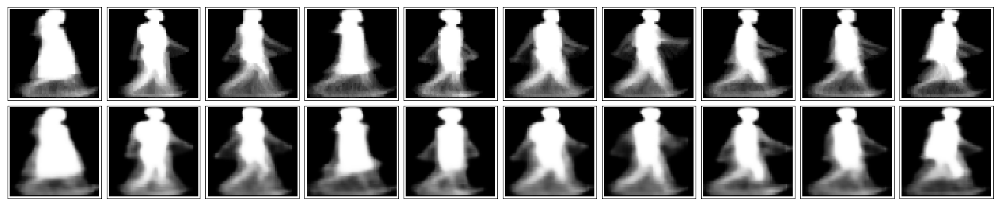

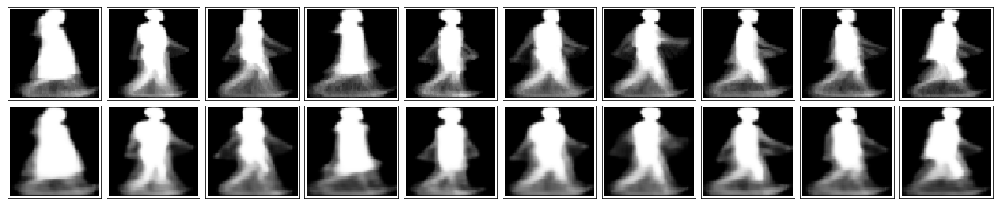

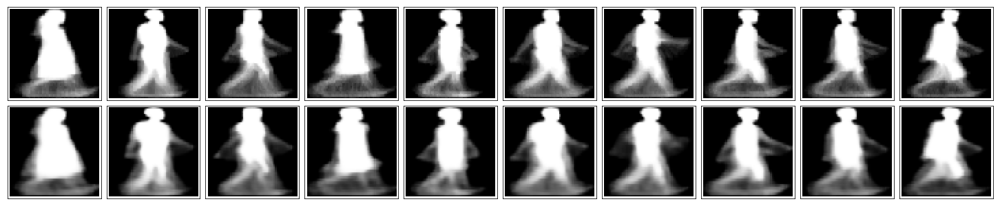

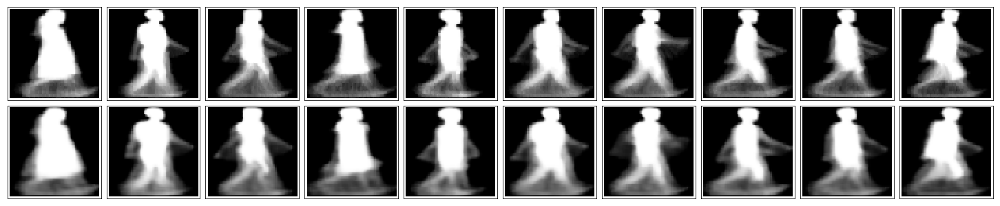

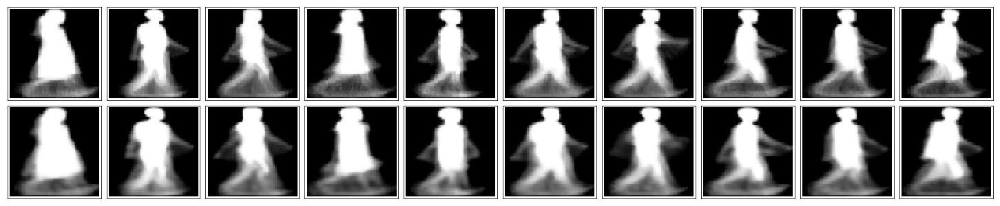

...

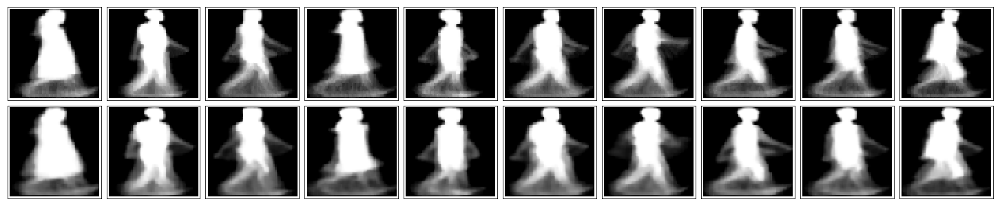

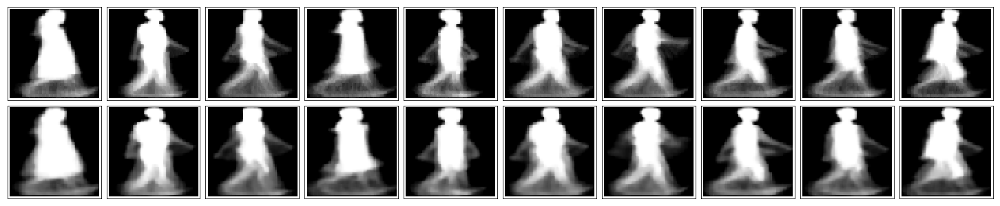

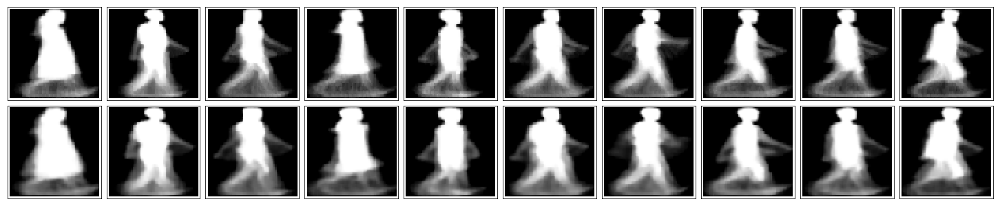

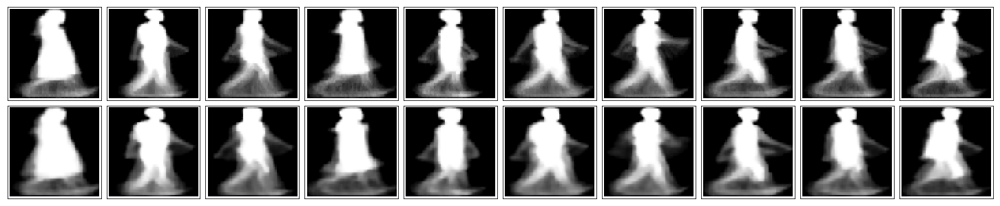

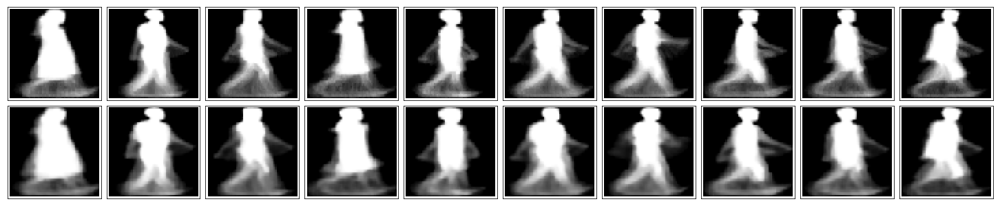

In [15]:
!mkdir checkpoints_view_invariant

Au = 1
num_layers = 2
epochs = 1500
batch_size = 80
conv_kern_size = (4,4)
conv_strides = (1,1)
pool_size = (2,2)
pool_strides = (2,2)
up_size = [(32,32), (64,64)]
de_kern_size = (4,4)
de_conv_strides = (1,1)
out_kern_size = (4,4)
out_strides = (1,1)
std = 0.02

for lr in [0.0013]:
#                 log_string = 'logs/4/lr={},nl={},ls={},bs={}'.format(lr, num_layers, lstm_size, batch_size)
    save_string = './checkpoints_view_invariant/Au={}_lr={}_nl={}_bs={}.ckpt'.format(Au, lr, num_layers, batch_size)
                
#             writer = tf.summary.FileWriter(log_string)
#     build_graph(kern_size, std, conv_strides, pool_size, pool_strides, de_kern_size, 
#                 de_conv_strides, out_kern_size, out_strides, up_size=[(16,16), (32,32), (64,64)], set_is_training=True):
    
    model = build_graph(conv_kern_size, std, conv_strides, pool_size, pool_strides, de_kern_size, de_conv_strides,
                        out_kern_size, out_strides, up_size=up_size)

    train(model, epochs, save_string)
                
    print(' ')
    print(' ')
    print("leraning_rate={},num_layers={},batch_size={} finished, saved".format(lr, num_layers, batch_size))
    print(' ')
    print(' ')

<br><br><br><br><br><br><br><br><br>

## Network Architecture

The encoder part of the network will be a typical convolutional pyramid. Each convolutional layer will be followed by a max-pooling layer to reduce the dimensions of the layers. The decoder though might be something new to you. The decoder needs to convert from a narrow representation to a wide reconstructed image. For example, the representation could be a 4x4x8 max-pool layer. This is the output of the encoder, but also the input to the decoder. We want to get a 28x28x1 image out from the decoder so we need to work our way back up from the narrow decoder input layer. A schematic of the network is shown below.

<img src='assets/convolutional_autoencoder.png' width=500px>

Here our final encoder layer has size 4x4x8 = 128. The original images have size 28x28 = 784, so the encoded vector is roughly 16% the size of the original image. These are just suggested sizes for each of the layers. Feel free to change the depths and sizes, but remember our goal here is to find a small representation of the input data.

### What's going on with the decoder

Okay, so the decoder has these "Upsample" layers that you might not have seen before. First off, I'll discuss a bit what these layers *aren't*. Usually, you'll see **transposed convolution** layers used to increase the width and height of the layers. They work almost exactly the same as convolutional layers, but in reverse. A stride in the input layer results in a larger stride in the transposed convolution layer. For example, if you have a 3x3 kernel, a 3x3 patch in the input layer will be reduced to one unit in a convolutional layer. Comparatively, one unit in the input layer will be expanded to a 3x3 path in a transposed convolution layer. The TensorFlow API provides us with an easy way to create the layers, [`tf.nn.conv2d_transpose`](https://www.tensorflow.org/api_docs/python/tf/nn/conv2d_transpose). 

However, transposed convolution layers can lead to artifacts in the final images, such as checkerboard patterns. This is due to overlap in the kernels which can be avoided by setting the stride and kernel size equal. In [this Distill article](http://distill.pub/2016/deconv-checkerboard/) from Augustus Odena, *et al*, the authors show that these checkerboard artifacts can be avoided by resizing the layers using nearest neighbor or bilinear interpolation (upsampling) followed by a convolutional layer. In TensorFlow, this is easily done with [`tf.image.resize_images`](https://www.tensorflow.org/versions/r1.1/api_docs/python/tf/image/resize_images), followed by a convolution. Be sure to read the Distill article to get a better understanding of deconvolutional layers and why we're using upsampling.

> **Exercise:** Build the network shown above. Remember that a convolutional layer with strides of 1 and 'same' padding won't reduce the height and width. That is, if the input is 28x28 and the convolution layer has stride = 1 and 'same' padding, the convolutional layer will also be 28x28. The max-pool layers are used the reduce the width and height. A stride of 2 will reduce the size by 2. Odena *et al* claim that nearest neighbor interpolation works best for the upsampling, so make sure to include that as a parameter in `tf.image.resize_images` or use [`tf.image.resize_nearest_neighbor`]( `https://www.tensorflow.org/api_docs/python/tf/image/resize_nearest_neighbor). For convolutional layers, use [`tf.layers.conv2d`](https://www.tensorflow.org/api_docs/python/tf/layers/conv2d). For example, you would write `conv1 = tf.layers.conv2d(inputs, 32, (5,5), padding='same', activation=tf.nn.relu)` for a layer with a depth of 32, a 5x5 kernel, stride of (1,1), padding is 'same', and a ReLU activation. Similarly, for the max-pool layers, use [`tf.layers.max_pooling2d`](https://www.tensorflow.org/api_docs/python/tf/layers/max_pooling2d).

## Training

As before, here wi'll train the network. Instead of flattening the images though, we can pass them in as 28x28x1 arrays.

In [6]:
sess = tf.Session()

In [ ]:
epochs = 20
batch_size = 200
sess.run(tf.global_variables_initializer())
for e in range(epochs):
    for ii in range(mnist.train.num_examples//batch_size):
        batch = mnist.train.next_batch(batch_size)
        imgs = batch[0].reshape((-1, 28, 28, 1))
        batch_cost, _ = sess.run([cost, opt], feed_dict={inputs_: imgs,
                                                         targets_: imgs})

        print("Epoch: {}/{}...".format(e+1, epochs),
              "Training loss: {:.4f}".format(batch_cost))

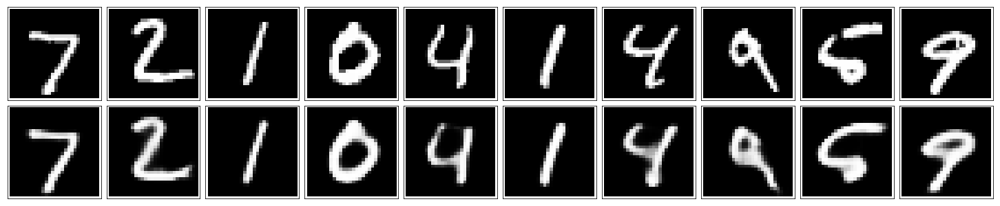

In [13]:
fig, axes = plt.subplots(nrows=2, ncols=10, sharex=True, sharey=True, figsize=(20,4))
in_imgs = mnist.test.images[:10]
reconstructed = sess.run(decoded, feed_dict={inputs_: in_imgs.reshape((10, 28, 28, 1))})

for images, row in zip([in_imgs, reconstructed], axes):
    for img, ax in zip(images, row):
        ax.imshow(img.reshape((28, 28)), cmap='Greys_r')
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)


fig.tight_layout(pad=0.1)

In [19]:
sess.close()

## Denoising

As I've mentioned before, autoencoders like the ones you've built so far aren't too useful in practive. However, they can be used to denoise images quite successfully just by training the network on noisy images. We can create the noisy images ourselves by adding Gaussian noise to the training images, then clipping the values to be between 0 and 1. We'll use noisy images as input and the original, clean images as targets. Here's an example of the noisy images I generated and the denoised images.

![Denoising autoencoder](assets/denoising.png)


Since this is a harder problem for the network, we'll want to use deeper convolutional layers here, more feature maps. I suggest something like 32-32-16 for the depths of the convolutional layers in the encoder, and the same depths going backward through the decoder. Otherwise the architecture is the same as before.

> **Exercise:** Build the network for the denoising autoencoder. It's the same as before, but with deeper layers. I suggest 32-32-16 for the depths, but you can play with these numbers, or add more layers.

In [21]:
inputs_ = tf.placeholder(tf.float32, (None, 28, 28, 1), name='inputs')
targets_ = tf.placeholder(tf.float32, (None, 28, 28, 1), name='targets')

### Encoder
conv1 = tf.layers.conv2d(inputs_, 32, (3,3), padding='same', activation=tf.nn.relu)
# Now 28x28x32
maxpool1 = tf.layers.max_pooling2d(conv1, (2,2), (2,2), padding='same')
# Now 14x14x32
conv2 = tf.layers.conv2d(maxpool1, 32, (3,3), padding='same', activation=tf.nn.relu)
# Now 14x14x32
maxpool2 = tf.layers.max_pooling2d(conv2, (2,2), (2,2), padding='same')
# Now 7x7x32
conv3 = tf.layers.conv2d(maxpool2, 16, (3,3), padding='same', activation=tf.nn.relu)
# Now 7x7x16
encoded = tf.layers.max_pooling2d(conv3, (2,2), (2,2), padding='same')
# Now 4x4x16

### Decoder
upsample1 = tf.image.resize_nearest_neighbor(encoded, (7,7))
# Now 7x7x16
conv4 = tf.layers.conv2d(upsample1, 16, (3,3), padding='same', activation=tf.nn.relu)
# Now 7x7x16
upsample2 = tf.image.resize_nearest_neighbor(conv4, (14,14))
# Now 14x14x16
conv5 = tf.layers.conv2d(upsample2, 32, (3,3), padding='same', activation=tf.nn.relu)
# Now 14x14x32
upsample3 = tf.image.resize_nearest_neighbor(conv5, (28,28))
# Now 28x28x32
conv6 = tf.layers.conv2d(upsample3, 32, (3,3), padding='same', activation=tf.nn.relu)
# Now 28x28x32

logits = tf.layers.conv2d(conv6, 1, (3,3), padding='same', activation=None)
#Now 28x28x1

decoded = tf.nn.sigmoid(logits, name='decoded')

loss = tf.nn.sigmoid_cross_entropy_with_logits(labels=targets_, logits=logits)
cost = tf.reduce_mean(loss)
opt = tf.train.AdamOptimizer(0.001).minimize(cost)

In [22]:
sess = tf.Session()

In [ ]:
epochs = 100
batch_size = 200
# Set's how much noise we're adding to the MNIST images
noise_factor = 0.5
sess.run(tf.global_variables_initializer())
for e in range(epochs):
    for ii in range(mnist.train.num_examples//batch_size):
        batch = mnist.train.next_batch(batch_size)
        # Get images from the batch
        imgs = batch[0].reshape((-1, 28, 28, 1))
        
        # Add random noise to the input images
        noisy_imgs = imgs + noise_factor * np.random.randn(*imgs.shape)
        # Clip the images to be between 0 and 1
        noisy_imgs = np.clip(noisy_imgs, 0., 1.)
        
        # Noisy images as inputs, original images as targets
        batch_cost, _ = sess.run([cost, opt], feed_dict={inputs_: noisy_imgs,
                                                         targets_: imgs})

        print("Epoch: {}/{}...".format(e+1, epochs),
              "Training loss: {:.4f}".format(batch_cost))

## Checking out the performance

Here I'm adding noise to the test images and passing them through the autoencoder. It does a suprising great job of removing the noise, even though it's sometimes difficult to tell what the original number is.

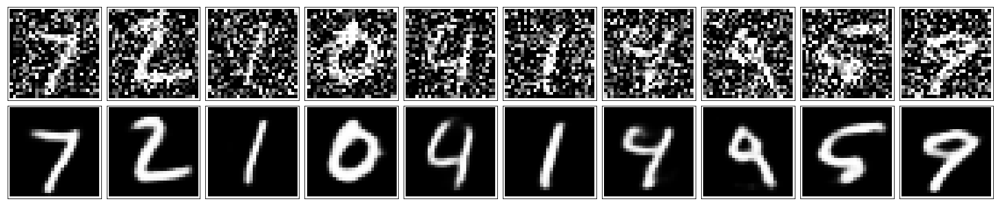

In [29]:
fig, axes = plt.subplots(nrows=2, ncols=10, sharex=True, sharey=True, figsize=(20,4))
in_imgs = mnist.test.images[:10]
noisy_imgs = in_imgs + noise_factor * np.random.randn(*in_imgs.shape)
noisy_imgs = np.clip(noisy_imgs, 0., 1.)

reconstructed = sess.run(decoded, feed_dict={inputs_: noisy_imgs.reshape((10, 28, 28, 1))})

for images, row in zip([noisy_imgs, reconstructed], axes):
    for img, ax in zip(images, row):
        ax.imshow(img.reshape((28, 28)), cmap='Greys_r')
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)

fig.tight_layout(pad=0.1)